# Machine Learning Homework 2025
### Bocci Giuseppe & Di Virgilio Giulia
### 10730427 & 11020862

In [1]:
import IPython


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

In [3]:
from ucimlrepo import fetch_ucirepo
  
# fetch dataset 
support2 = fetch_ucirepo(id=880)

In [4]:
# data (as pandas dataframes) 
X = support2.data.features 
y = support2.data.targets 
  
# metadata 
print(support2.metadata) 
  
# variable information 
print(support2.variables) 

# handier to check them on https://archive.ics.uci.edu/dataset/880/support2

{'uci_id': 880, 'name': 'SUPPORT2', 'repository_url': 'https://archive.ics.uci.edu/dataset/880/support2', 'data_url': 'https://archive.ics.uci.edu/static/public/880/data.csv', 'abstract': "This dataset comprises 9105 individual critically ill patients across 5 United States medical centers, accessioned throughout 1989-1991 and 1992-1994.\nEach row concerns hospitalized patient records who met the inclusion and exclusion criteria for nine disease categories: acute respiratory failure, chronic obstructive pulmonary disease, congestive heart failure, liver disease, coma, colon cancer, lung cancer, multiple organ system failure with malignancy, and multiple organ system failure with sepsis. The goal is to determine these patients' 2- and 6-month survival rates based on several physiologic, demographics, and disease severity information. \nIt is an important problem because it addresses the growing national concern over patients' loss of control near the end of life. It enables earlier deci

In [5]:
# for checking out the df, smples and variables, very first info etc
print(X.shape) # we have 9105 rows (samples) and 42 columns (features)
print(X.head)

# to check the target variables – 3 columns
print(y.head())
print(y.info())
print(y.shape)

(9105, 42)
<bound method NDFrame.head of            age     sex            dzgroup             dzclass  num.co   edu  \
0     62.84998    male        Lung Cancer              Cancer       0  11.0   
1     60.33899  female          Cirrhosis  COPD/CHF/Cirrhosis       2  12.0   
2     52.74698  female          Cirrhosis  COPD/CHF/Cirrhosis       2  12.0   
3     42.38498  female        Lung Cancer              Cancer       2  11.0   
4     79.88495  female  ARF/MOSF w/Sepsis            ARF/MOSF       1   NaN   
...        ...     ...                ...                 ...     ...   ...   
9100  66.07300    male  ARF/MOSF w/Sepsis            ARF/MOSF       1   8.0   
9101  55.15399  female               Coma                Coma       1  11.0   
9102  70.38196    male  ARF/MOSF w/Sepsis            ARF/MOSF       1   NaN   
9103  47.01999    male       MOSF w/Malig            ARF/MOSF       1  13.0   
9104  81.53894  female  ARF/MOSF w/Sepsis            ARF/MOSF       1   8.0   

          

In [6]:
y["death"] # 0 - 1
y["hospdead"] # 0 - 1
print(y["sfdm2"].value_counts(dropna=False))
print(sum(y["death"])) # 1994
print(sum(y["hospdead"]))


sfdm2
<2 mo. follow-up       3123
no(M2 and SIP pres)    3061
NaN                    1400
adl>=4 (>=5 if sur)     916
SIP>=30                 564
Coma or Intub            41
Name: count, dtype: int64
6201
2360


For the indicated features we follow the guidelines and fill the missing values

In [7]:
tab_nan = {"alb":3.5, "pafi":333.3, "bili":1.01, "crea":1.01, "bun":6.51, "wblc":9, "urine":2502}
for feature, val in tab_nan.items():
    mask = np.isnan(X[feature].values)
    X.loc[mask, feature] = val

Deleting of the indicated features

In [8]:
del_feat = ['aps', 'sps', 'surv2m', 'surv6m', 'prg2m', 'prg6m', 'dnr', 'dnrday']
X = X.drop(columns=del_feat)

Several categorical variables are present, so we transform them using one-hot encoding, dropping the first category to avoid the dummy variable trap. This allows us to add potentially useful information, but at the same time increases dimensionality, which could lead to sparse data.

In [9]:
print(X['dzclass'].value_counts())
dzclass_dummies = pd.get_dummies(X['dzclass'], prefix='dzclass', drop_first=True)
X = pd.concat([X, dzclass_dummies], axis=1)
print(X.columns)

dzclass
ARF/MOSF              4227
COPD/CHF/Cirrhosis    2862
Cancer                1420
Coma                   596
Name: count, dtype: int64
Index(['age', 'sex', 'dzgroup', 'dzclass', 'num.co', 'edu', 'income', 'scoma',
       'charges', 'totcst', 'totmcst', 'avtisst', 'race', 'hday', 'diabetes',
       'dementia', 'ca', 'meanbp', 'wblc', 'hrt', 'resp', 'temp', 'pafi',
       'alb', 'bili', 'crea', 'sod', 'ph', 'glucose', 'bun', 'urine', 'adlp',
       'adls', 'adlsc', 'dzclass_COPD/CHF/Cirrhosis', 'dzclass_Cancer',
       'dzclass_Coma'],
      dtype='object')


In [10]:
print(X['dzgroup'].value_counts())
dzgroup_dummies = pd.get_dummies(X['dzgroup'], prefix='dzgroup', drop_first=True)
X = pd.concat([X, dzgroup_dummies], axis=1)
print(X.columns)

dzgroup
ARF/MOSF w/Sepsis    3515
CHF                  1387
COPD                  967
Lung Cancer           908
MOSF w/Malig          712
Coma                  596
Colon Cancer          512
Cirrhosis             508
Name: count, dtype: int64
Index(['age', 'sex', 'dzgroup', 'dzclass', 'num.co', 'edu', 'income', 'scoma',
       'charges', 'totcst', 'totmcst', 'avtisst', 'race', 'hday', 'diabetes',
       'dementia', 'ca', 'meanbp', 'wblc', 'hrt', 'resp', 'temp', 'pafi',
       'alb', 'bili', 'crea', 'sod', 'ph', 'glucose', 'bun', 'urine', 'adlp',
       'adls', 'adlsc', 'dzclass_COPD/CHF/Cirrhosis', 'dzclass_Cancer',
       'dzclass_Coma', 'dzgroup_CHF', 'dzgroup_COPD', 'dzgroup_Cirrhosis',
       'dzgroup_Colon Cancer', 'dzgroup_Coma', 'dzgroup_Lung Cancer',
       'dzgroup_MOSF w/Malig'],
      dtype='object')


The data is not balanced for some variables, such as race. This gives us less statistical power in those categories, and other problems could arise.

In [11]:
print(X["race"].value_counts())
print(X["diabetes"].value_counts())
print(X["dementia"].value_counts())

race
white       7191
black       1391
hispanic     290
other        112
asian         79
Name: count, dtype: int64
diabetes
0    7327
1    1778
Name: count, dtype: int64
dementia
0    8809
1     296
Name: count, dtype: int64


In [12]:
# 'ca'
ca_dummies = pd.get_dummies(X['ca'], prefix='ca', drop_first=True)
X = pd.concat([X, ca_dummies], axis=1)
print(X.columns)

Index(['age', 'sex', 'dzgroup', 'dzclass', 'num.co', 'edu', 'income', 'scoma',
       'charges', 'totcst', 'totmcst', 'avtisst', 'race', 'hday', 'diabetes',
       'dementia', 'ca', 'meanbp', 'wblc', 'hrt', 'resp', 'temp', 'pafi',
       'alb', 'bili', 'crea', 'sod', 'ph', 'glucose', 'bun', 'urine', 'adlp',
       'adls', 'adlsc', 'dzclass_COPD/CHF/Cirrhosis', 'dzclass_Cancer',
       'dzclass_Coma', 'dzgroup_CHF', 'dzgroup_COPD', 'dzgroup_Cirrhosis',
       'dzgroup_Colon Cancer', 'dzgroup_Coma', 'dzgroup_Lung Cancer',
       'dzgroup_MOSF w/Malig', 'ca_no', 'ca_yes'],
      dtype='object')


In [13]:
race_dummies = pd.get_dummies(X['race'], prefix='race', drop_first=True)
X = pd.concat([X, race_dummies], axis=1)
print(X.columns)

Index(['age', 'sex', 'dzgroup', 'dzclass', 'num.co', 'edu', 'income', 'scoma',
       'charges', 'totcst', 'totmcst', 'avtisst', 'race', 'hday', 'diabetes',
       'dementia', 'ca', 'meanbp', 'wblc', 'hrt', 'resp', 'temp', 'pafi',
       'alb', 'bili', 'crea', 'sod', 'ph', 'glucose', 'bun', 'urine', 'adlp',
       'adls', 'adlsc', 'dzclass_COPD/CHF/Cirrhosis', 'dzclass_Cancer',
       'dzclass_Coma', 'dzgroup_CHF', 'dzgroup_COPD', 'dzgroup_Cirrhosis',
       'dzgroup_Colon Cancer', 'dzgroup_Coma', 'dzgroup_Lung Cancer',
       'dzgroup_MOSF w/Malig', 'ca_no', 'ca_yes', 'race_black',
       'race_hispanic', 'race_other', 'race_white'],
      dtype='object')


We can see income as an ordianl variable

In [14]:
print(X['income'].value_counts())
X['income'] = X['income'].map({'under $11k': 1, '$11-$25k': 2, '$25-$50k': 3, '>$50k': 4})

income
under $11k    2855
$11-$25k      1527
$25-$50k      1057
>$50k          684
Name: count, dtype: int64


In [15]:
print(X['sex'].value_counts())
X['sex'] = X['sex'].map({'male': 1, 'female': 0})
np.sum(X['sex'])

sex
male      5125
female    3980
Name: count, dtype: int64


np.int64(5125)

In [16]:
X['death'] = y['death']

A first visualization is performed to try to catch trivial associations. We plot the dead patients in red and the alive ones in blue.

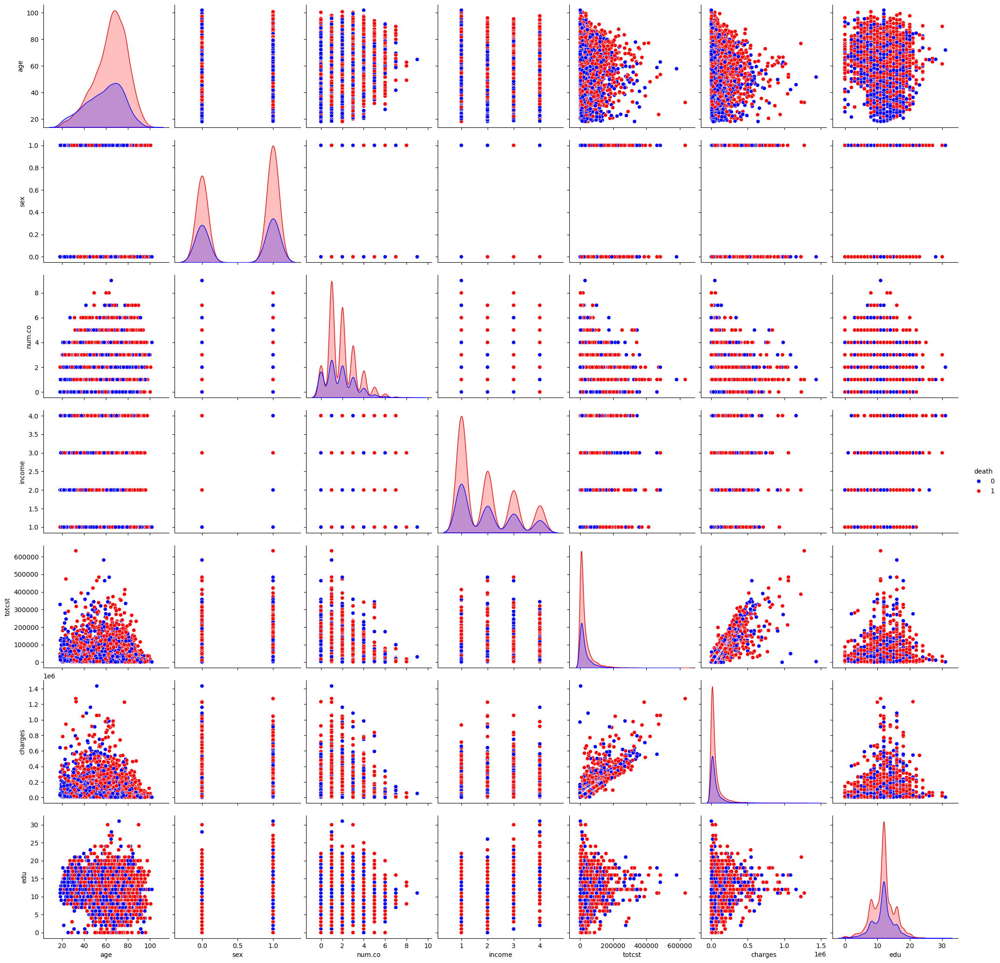

In [17]:
to_explore = ["age", "sex", "num.co", "income", "totcst", "charges", "edu"] # slos, scome # dzclass" "race"
X.columns
sns.pairplot(X[to_explore + ["death"]], hue='death', height=3,
             palette={True: 'red', False: 'blue'})

As it is well known that income and education are correlated, we tried to understand how income was handled for patients who are very young and possibly still in the education system. This issue was raised because we believe that, especially in a private healthcare system, income could affect a patient’s outcome. However, it is likely more informative for older patients than for younger ones, as the latter are usually supported by their families.

We observed that across different age bins, the amount of missing data on income was approximately the same, so we were not able to make strong assumptions. In general, even if we lose more data, we prefer to use income as a variable rather than education, as we believe it is more informative, especially considering the age distribution in our dataset.

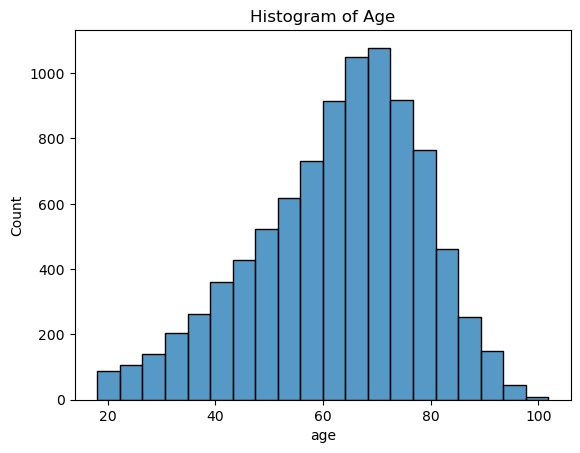

age_r
34.0    58
31.0    50
33.0    42
32.0    42
30.0    41
26.0    33
29.0    32
27.0    32
23.0    30
28.0    29
21.0    28
20.0    22
24.0    21
25.0    20
22.0    19
19.0    16
18.0     6
Name: count, dtype: int64
94


/var/folders/dj/3h3s026j0l59rznzby2p5djw0000gn/T/ipykernel_8229/3104656071.py:11: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  age_income_nan = X.groupby('age_bin', group_keys=False).apply(
/var/folders/dj/3h3s026j0l59rznzby2p5djw0000gn/T/ipykernel_8229/3104656071.py:11: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  age_income_nan = X.groupby('age_bin', group_keys=False).apply(


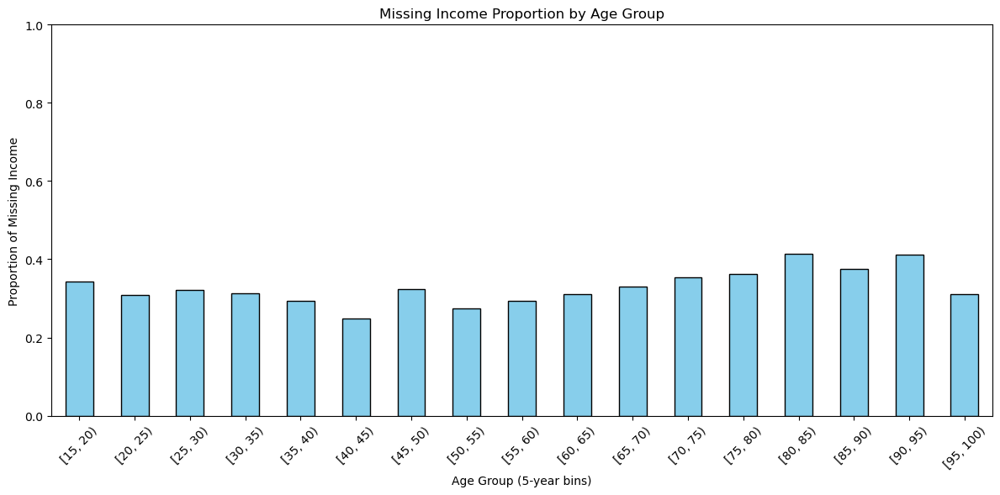

income
1.0    44
2.0    24
3.0    18
4.0    11
Name: count, dtype: int64


In [18]:
sns.histplot(data=X, x='age', bins=20, kde=False)  # `kde=True` adds a density curve
plt.title('Histogram of Age')
plt.show()

X['age_r'] = round(X['age']) 
print(X['age_r'][X['age_r'] < 35].value_counts())
print(X['income'][X['age_r'] < 30].isna().sum())
X['age_bin'] = pd.cut(X['age'], bins=range(15, 101, 5), right=False)


age_income_nan = X.groupby('age_bin', group_keys=False).apply(
    lambda g: pd.Series({
        'total': len(g),
        'nan_income': g['income'].isna().sum() # almost costant, same for edu
    })
)

age_income_nan['nan_prop'] = age_income_nan['nan_income'] / age_income_nan['total']


plt.figure(figsize=(12, 6))
age_income_nan['nan_prop'].plot(kind='bar', color='skyblue', edgecolor='black')
plt.ylabel('Proportion of Missing Income')
plt.xlabel('Age Group (5-year bins)')
plt.title('Missing Income Proportion by Age Group')
plt.ylim(0, 1)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print(X['income'][X['age_r'] < 25].value_counts())

Scaling of the incame (this is not a necessary step)

In [19]:
X['income'] = (X['income'] - 1/2) / 4
print(X['income'].value_counts())

income
0.125    2855
0.375    1527
0.625    1057
0.875     684
Name: count, dtype: int64


We explored the correlation among features.
Correlation between two one-hot encoded columns is limited, as they are often mutually exclusive, and we therefore expect negative correlations.
It’s also important to note that the correlation between categorical and continuous variables should be interpreted more as an association, as it typically reflects differences in mean values between groups.
For categorical variables, there are more appropriate measures of association, but for exploratory analysis, this kind of correlation is often sufficient.

We excluded dz_group because, by construction, it is highly correlated with dz_class. However, in general, we prefer using dz_group because it is more specific. For now, to reduce the dimensionality of the visualization, dz_class is more convenient.

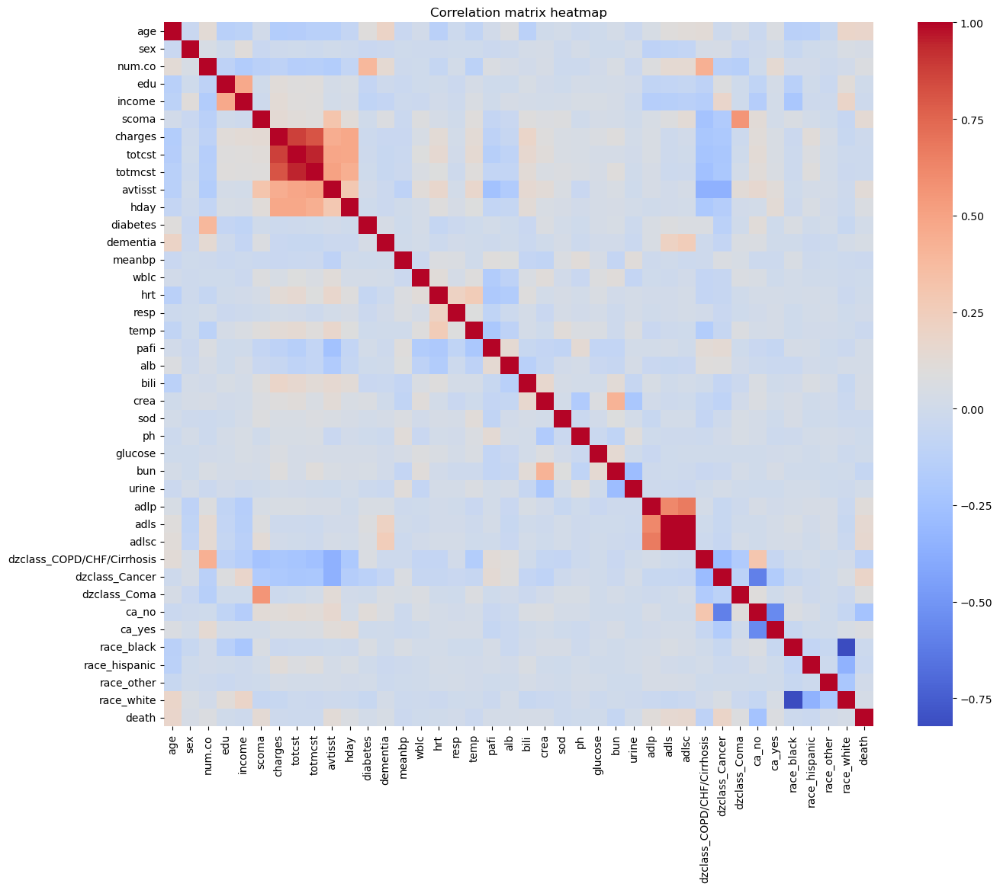

In [20]:
corr_to_e = ['age', 'sex', 'num.co', 'edu', 'income', 'scoma',
       'charges', 'totcst', 'totmcst', 'avtisst', 'hday', 'diabetes',
       'dementia', 'meanbp', 'wblc', 'hrt', 'resp', 'temp', 'pafi',
       'alb', 'bili', 'crea', 'sod', 'ph', 'glucose', 'bun', 'urine', 'adlp',
       'adls', 'adlsc', 'dzclass_COPD/CHF/Cirrhosis', 'dzclass_Cancer',
       'dzclass_Coma','ca_no', 'ca_yes', 'race_black',
       'race_hispanic', 'race_other', 'race_white', 'death']
 # 'dzgroup_CHF', 'dzgroup_COPD', 'dzgroup_Cirrhosis',
 #       'dzgroup_Colon Cancer', 'dzgroup_Coma', 'dzgroup_Lung Cancer',
 #       'dzgroup_MOSF w/Malig', 
corr_to_explore = X[corr_to_e].corr()


plt.figure(figsize=(15,12))
sns.heatmap(corr_to_explore, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Correlation matrix heatmap")
plt.show()


Clear clusters of correlated features are observed, in particular:

- education and income, which are expected to correlate.
- charges, totcst, totmcst, and avtisst: this makes sense, as they are all related to healthcare costs. We also observe some positive correlation with education and income—though this might be random—and negative correlation with certain disease classes associated with early death, as fewer days are spent in the hospital in such cases. Some well-known biomarkers also stand out, such as abl.
- adlp, adls, and adlsc, which represent similar scoring systems for daily living activities.
- smaller or binary clusters, including obvious ones like dzclass_Coma and scoma, which are naturally correlated.

In [21]:
print(y['death'])
print(X.columns)
print(np.sum(y['death']))

0       0
1       1
2       1
3       1
4       0
       ..
9100    0
9101    0
9102    0
9103    1
9104    1
Name: death, Length: 9105, dtype: int64
Index(['age', 'sex', 'dzgroup', 'dzclass', 'num.co', 'edu', 'income', 'scoma',
       'charges', 'totcst', 'totmcst', 'avtisst', 'race', 'hday', 'diabetes',
       'dementia', 'ca', 'meanbp', 'wblc', 'hrt', 'resp', 'temp', 'pafi',
       'alb', 'bili', 'crea', 'sod', 'ph', 'glucose', 'bun', 'urine', 'adlp',
       'adls', 'adlsc', 'dzclass_COPD/CHF/Cirrhosis', 'dzclass_Cancer',
       'dzclass_Coma', 'dzgroup_CHF', 'dzgroup_COPD', 'dzgroup_Cirrhosis',
       'dzgroup_Colon Cancer', 'dzgroup_Coma', 'dzgroup_Lung Cancer',
       'dzgroup_MOSF w/Malig', 'ca_no', 'ca_yes', 'race_black',
       'race_hispanic', 'race_other', 'race_white', 'death', 'age_r',
       'age_bin'],
      dtype='object')
6201


As several NaN values are present, we need to exclude some features to reduce their impact. We will prioritize removing highly correlated features.
- We have already discussed education and income.
- In general, we will prefer to retain charges over totcst and totmcst.
- We will exclude ph and glucose due to the high amount of missing values. We chose not to impute them because we assume there is a specific reason why they were not included in the imputed features in guidelines, although this reason is not clearly explained.
- adlsc will always be preferred over adlp and adls

In [22]:
print(X[corr_to_e].isna().sum())
num_rows_with_nan = X[corr_to_e].isna().any(axis=1).sum()
print(num_rows_with_nan) # Non fattibile eliminarli
# DEL
# totmcst, charges, edu,
# adls, adlp

# FILL IN
# ph, glucose 

age                              0
sex                              0
num.co                           0
edu                           1634
income                        2982
scoma                            1
charges                        172
totcst                         888
totmcst                       3475
avtisst                         82
hday                             0
diabetes                         0
dementia                         0
meanbp                           1
wblc                             0
hrt                              1
resp                             1
temp                             1
pafi                             0
alb                              0
bili                             0
crea                             0
sod                              1
ph                            2284
glucose                       4500
bun                              0
urine                            0
adlp                          5641
adls                

In [23]:
features = ['age', 'sex', 'num.co', 'income', 'scoma', # edu
       'avtisst', 'hday', 'diabetes', 'charges', # 'totcst',
       'dementia', 'meanbp', 'wblc', 'hrt', 'resp', 'temp', 'pafi',
       'alb', 'bili', 'crea', 'sod',  'bun', 'urine', #'ph', 'glucose',
       'adlsc', 'race_black', 'race_hispanic', 'race_other', 'race_white',
       'ca_no', 'ca_yes','dzgroup_CHF', 'dzgroup_COPD', 'dzgroup_Cirrhosis', #  'ca_metastatic',
       'dzgroup_Colon Cancer', 'dzgroup_Coma', 'dzgroup_Lung Cancer',  # dz_group_SEPSIS
       'dzgroup_MOSF w/Malig']

print(X['avtisst'].value_counts(dropna=False))
pd.crosstab(X['avtisst'].isna(), X['death']) # No possible assumptions here

avtisst
11.000000    246
10.000000    227
12.000000    225
9.000000     214
13.000000    214
            ... 
73.000000      1
7.250000       1
1.500000       1
55.750000      1
3.333332       1
Name: count, Length: 353, dtype: int64


death,0,1
avtisst,,
False,2870,6153
True,34,48


In [24]:
print(X[features].isna().sum())
num_rows_with_nan = X[features].isna().any(axis=1).sum()
print(num_rows_with_nan)
print(np.sum(X[X[features].isna().any(axis=1)]['death'])) # balanced?

age                        0
sex                        0
num.co                     0
income                  2982
scoma                      1
avtisst                   82
hday                       0
diabetes                   0
charges                  172
dementia                   0
meanbp                     1
wblc                       0
hrt                        1
resp                       1
temp                       1
pafi                       0
alb                        0
bili                       0
crea                       0
sod                        1
bun                        0
urine                      0
adlsc                      0
race_black                 0
race_hispanic              0
race_other                 0
race_white                 0
ca_no                      0
ca_yes                     0
dzgroup_CHF                0
dzgroup_COPD               0
dzgroup_Cirrhosis          0
dzgroup_Colon Cancer       0
dzgroup_Coma               0
dzgroup_Lung C

### CLASSIFICATION
#### First analysis for Classification
A first analysis is performed using K-Nearest Neighbors (KNN) with k = 1.
The random seed (split_seed) is set to ensure proper model validation and to make the results reproducible.

*It is necessary for the data to be the same in order to fairly compare and validate the models, even though this is not always possible.*

In [25]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, accuracy_score

split_seed = 42
split_test_size = 0.2

train_data = X.select_dtypes(exclude=['object', 'category']).copy()
train_data = train_data.drop(columns=['age_r', 'death'])
train_data['target'] = y['death'].copy()
bool_cols = train_data.select_dtypes(include='bool').columns
train_data[bool_cols] = train_data[bool_cols].astype(float)

X_clean = train_data.drop(columns='target')
y_clean = train_data['target']
X_train, X_test, y_train, y_test = train_test_split(X_clean, y_clean, test_size=split_test_size, random_state=split_seed)


def create_data_classification(features, drop_na=True):
    train_data_1 = X.select_dtypes(exclude=['object', 'category']).copy()
    train_data_1 = train_data_1.drop(columns='age_r')
    train_data_1['target'] = y['death'].copy()
    bool_cols = train_data_1.select_dtypes(include='bool').columns
    train_data_1[bool_cols] = train_data_1[bool_cols].astype(float)
    
    if drop_na:
        train_data_clean_1 = train_data_1[features + ['target']].dropna()
    else:
        train_data_clean_1 = train_data_1[features + ['target']]
         
    X_clean_1 = train_data_clean_1.drop(columns='target')
    y_clean_1 = train_data_clean_1['target']

    X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(X_clean_1, y_clean_1, test_size=split_test_size, random_state=split_seed)
    
    return X_clean_1, y_clean_1, X_train_1, X_test_1, y_train_1, y_test_1
#X_clean, y_clean, X_train, X_test, y_train, y_test = create_data_classification(features)

def remove_na_classification(features, numpy_flag=False):
    combined = pd.concat([X_train[features], y_train], axis=1)
    mask = ~combined.isna().any(axis=1)
    
    X_train_1 = X_train.loc[mask, features]
    y_train_1 = y_train.loc[mask]
    
    combined_test = pd.concat([X_test[features], y_test], axis=1)
    mask_test = ~combined_test.isna().any(axis=1)
    
    X_test_1 = X_test.loc[mask_test, features]
    y_test_1 = y_test.loc[mask_test]

    print("X_train data:", X_train_1.shape[0])
    print("X_test data:", X_test_1.shape[0])
    
    if numpy_flag:
        return (
            X_train_1.to_numpy(dtype=float),
            X_test_1.to_numpy(dtype=float),
            y_train_1.to_numpy(dtype=float),
            y_test_1.to_numpy(dtype=float)
        )
    return X_train_1, X_test_1, y_train_1, y_test_1


We can clrearly see that the majority of the features is not gaussian distibuited and a lot of outliers are present

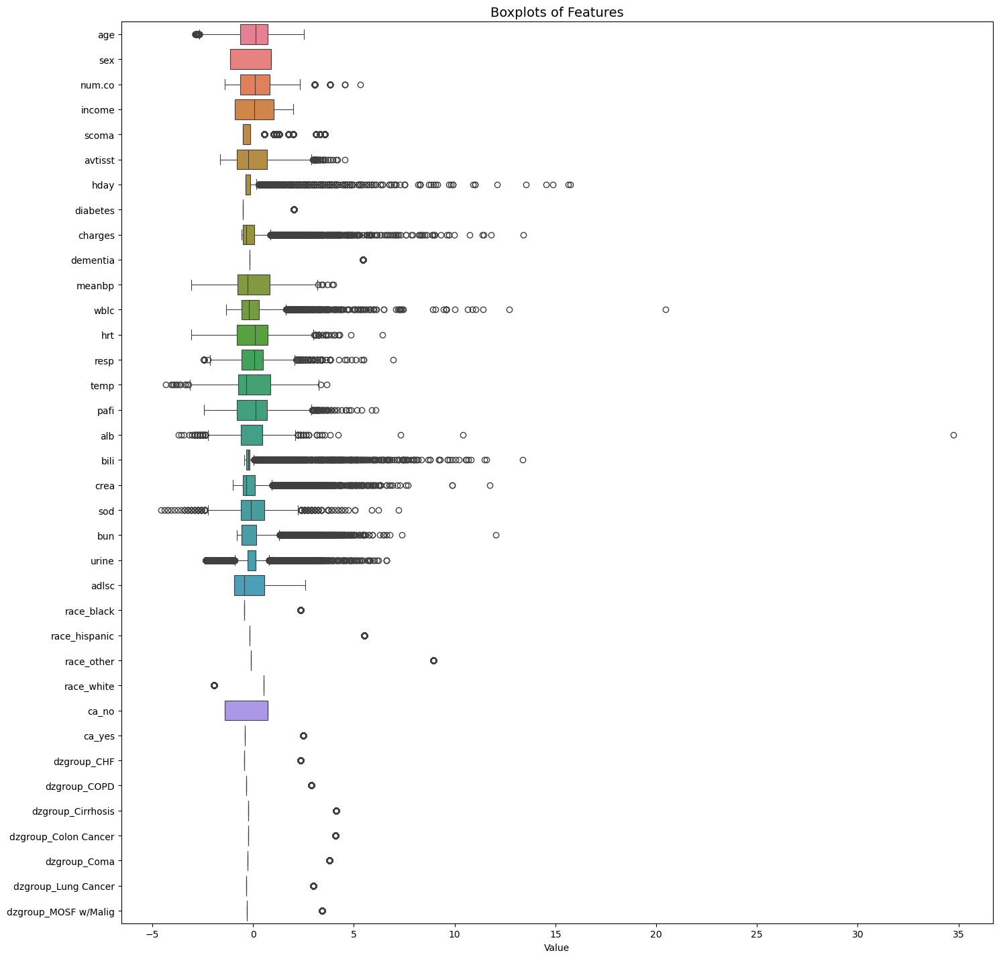

In [26]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_clean_scaled = scaler.fit_transform(X_clean[features])
X_scaled_df = pd.DataFrame(X_clean_scaled, columns=features)

# Set plotting style
plt.figure(figsize=(15, len(features) * 0.4))
sns.boxplot(data=X_scaled_df, orient='h', linewidth=0.8, )

plt.title("Boxplots of Features", fontsize=14)
plt.xlabel("Value")
plt.tight_layout()
plt.show()

To evaluate the model, we will use the F1 score because we want to balance precision and recall. We avoid using accuracy since it can be easily affected by class imbalance.

In [27]:
X_train_knn, X_test_knn, y_train_knn, y_test_knn = remove_na_classification(features, True)

model = KNeighborsClassifier(n_neighbors=1)

model.fit(X_train_knn, y_train_knn)

def model_scores_classification(model, X_train, X_test, y_train, y_test):
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    print("Train accuracy:", accuracy_score(y_train, y_train_pred))
    print("Test accuracy:", accuracy_score(y_test,y_test_pred))
    print("Train f1:", f1_score(y_train, y_train_pred))
    print("Test f1:", f1_score(y_test, y_test_pred))

model_scores_classification(model, X_train_knn, X_test_knn, y_train_knn, y_test_knn)

X_train data: 4733
X_test data: 1208
Train accuracy: 1.0
Test accuracy: 0.5662251655629139
Train f1: 1.0
Test f1: 0.6745341614906832


The Mardia test is performed to check whether the classes "death" and "alive" are Gaussian distributed across the features. If they are not, we can already conclude that LDA and QDA may not be the best choices.

In [28]:
from scipy.stats import chi2, norm

def mardia_test(X, alpha=0.05):
    n, p = X.shape
    X_centered = X - X.mean(axis=0)
    S = np.cov(X_centered, rowvar=False)
    S_inv = np.linalg.inv(S)

    # Mahalanobis distances
    D_squared = np.array([x.T @ S_inv @ x for x in X_centered])

    # Mardia skewness
    skewness = np.sum([(x1.T @ S_inv @ x2)**3 for x1 in X_centered for x2 in X_centered]) / n**2
    skew_stat = n * skewness / 6
    skew_df = p * (p + 1) * (p + 2) / 6
    skew_p = 1 - chi2.cdf(skew_stat, df=skew_df)

    # Mardia kurtosis
    kurtosis = np.mean(D_squared**2)
    expected_kurtosis = p * (p + 2)
    kurt_z = (kurtosis - expected_kurtosis) / np.sqrt(8 * p * (p + 2) / n)
    kurt_p = 2 * (1 - norm.cdf(abs(kurt_z)))

    print(f"Skewness (stat): {skew_stat:.3f}, p-value: {skew_p:.5f}")
    print(f"Kurtosis (stat): {kurtosis:.3f}, z-score: {kurt_z:.3f}, p-value: {kurt_p:.5f}")

    # Decision
    if skew_p > alpha and kurt_p > alpha:
        print("✅ Data appears to follow a multivariate normal distribution.")
    else:
        print("❌ Data does NOT appear to follow a multivariate normal distribution.")

    return skew_p, kurt_p

X_clean_mardia = pd.concat([X_clean[features].copy(), y_clean.copy()], axis=1)
X_clean_mardia = X_clean_mardia.dropna()
# Run for each class
for label in (0, 1):
    print(f"\nClass {label}")
    X_class = X_clean_mardia[X_clean_mardia['target'] == label][features].astype(float).to_numpy()
    mardia_test(X_class)

# preferible to not use QDA


Class 0
Skewness (stat): 261319.799, p-value: 0.00000
Kurtosis (stat): 2228.043, z-score: 364.893, p-value: 0.00000
❌ Data does NOT appear to follow a multivariate normal distribution.

Class 1
Skewness (stat): 416808.063, p-value: 0.00000
Kurtosis (stat): 2266.576, z-score: 541.273, p-value: 0.00000
❌ Data does NOT appear to follow a multivariate normal distribution.


Random features are plotted in 3-dimensional plots to further explore the data.
Categorical variables could influence the model by creating distinct cohorts. Support Vector Machines (SVM) do not handle categorical variables well because they optimize distances in a continuous space, so we will start with other models.

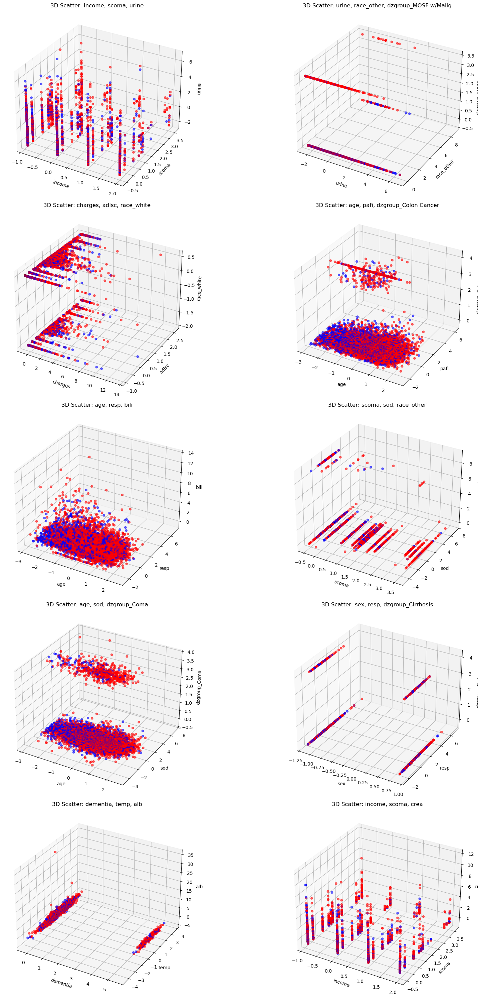

In [29]:
from mpl_toolkits.mplot3d import Axes3D
import random
import itertools
from sklearn.preprocessing import StandardScaler

# just for visualization
scaler = StandardScaler()
X_scaled_df = pd.DataFrame(scaler.fit_transform(X_clean[features]), columns=features)

# Convert y to numpy array for easier indexing
y_array = y_clean.to_numpy()

# Pick 10 random combinations of 3 different features
features = X_scaled_df.columns.tolist()
triplets = random.sample(list(itertools.combinations(features, 3)), 10)

fig = plt.figure(figsize=(20, 30))
for i, (f1, f2, f3) in enumerate(triplets):
    ax = fig.add_subplot(5, 2, i + 1, projection='3d')
    
    xs = X_scaled_df[f1]
    ys = X_scaled_df[f2]
    zs = X_scaled_df[f3]

    colors = ['red' if label else 'blue' for label in y_array]

    ax.scatter(xs, ys, zs, c=colors, alpha=0.6)
    ax.set_xlabel(f1)
    ax.set_ylabel(f2)
    ax.set_zlabel(f3)
    ax.set_title(f'3D Scatter: {f1}, {f2}, {f3}')

plt.tight_layout()
plt.show()

Random Forest classifiers are widely used in the medical field, especially because their trees can be interpretable through plotting. Random Forest is resilient to multicollinearity, so no specific feature selection was performed.

In [30]:
from sklearn.ensemble import RandomForestClassifier

X_train_rf, X_test_rf, y_train_rf, y_test_rf = remove_na_classification(features)

model = RandomForestClassifier(n_estimators=300, random_state=split_seed, max_leaf_nodes=64)
model.fit(X_train_rf, y_train_rf)

model_scores_classification(model, X_train_rf, X_test_rf, y_train_rf, y_test_rf)


X_train data: 4733
X_test data: 1208
Train accuracy: 0.8054088316078597
Test accuracy: 0.7475165562913907
Train f1: 0.8681460272011453
Test f1: 0.8306496390893948


A grid search with cross-validation (CV) is performed to choose the best hyperparameters. The model is then retrained on the entire training data and tested. The CV F1 score is used as the metric to compare models. A StratifiedKFold is defined to shuffle and split the data consistently into the same folds.

In [31]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score, StratifiedKFold

cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=split_seed)

param_grid = {
    'max_leaf_nodes': [8, 16, 32, 64, 128],
    'n_estimators': [50, 100, 150, 200]
}
base_model = RandomForestClassifier(random_state=split_seed)

grid = GridSearchCV(base_model, param_grid, cv=cv, scoring='f1', n_jobs=-1)
grid.fit(X_train_rf, y_train_rf)
best_model = grid.best_estimator_
print(f"Best max_leaf_nodes: {grid.best_params_['max_leaf_nodes']}")
print(f"Best n_estimators: {grid.best_params_['n_estimators']}")
print(f"Best cv f1 score: {grid.best_score_}")

print("\nFinal model")
model_rf = RandomForestClassifier(
    max_leaf_nodes=grid.best_params_['max_leaf_nodes'],
    random_state=split_seed,
    n_estimators=grid.best_params_['n_estimators']
)
model_rf.fit(X_train_rf, y_train_rf)
model_scores_classification(model_rf,  X_train_rf, X_test_rf, y_train_rf, y_test_rf)

Best max_leaf_nodes: 128
Best n_estimators: 150
Best cv f1 score: 0.8213764430129487

Final model
Train accuracy: 0.8601309951405028
Test accuracy: 0.7367549668874173
Train f1: 0.9031880666861656
Test f1: 0.8215488215488216


Without plotting all the decision trees, a shallow decision tree is used to approximate the ensemble and provide a quick interpretation.

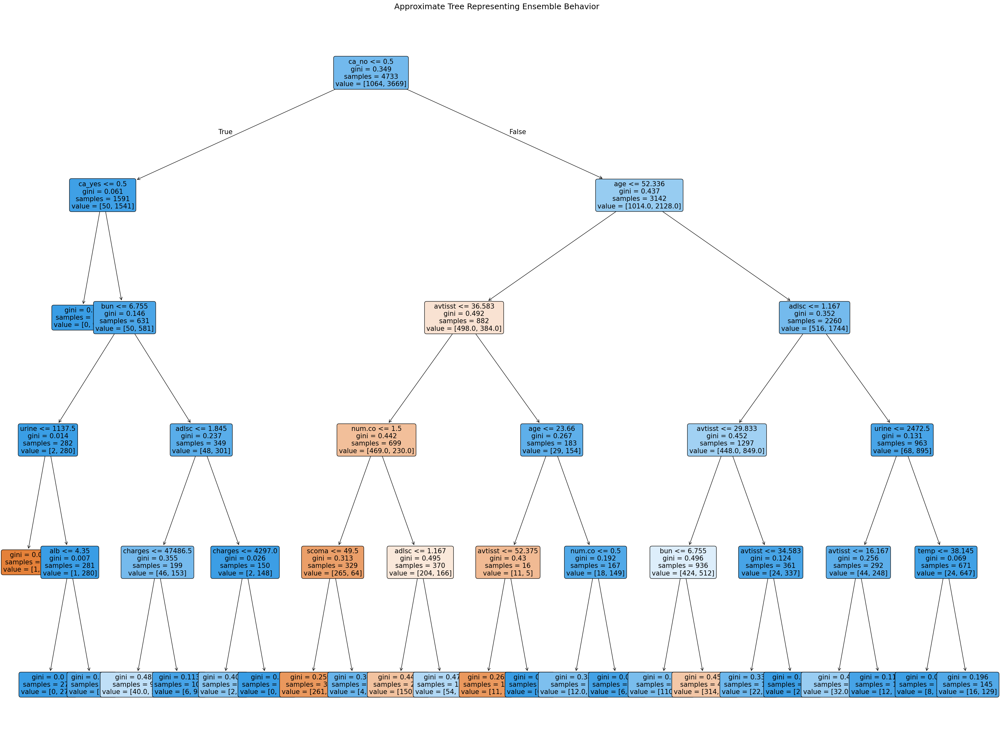

In [32]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree

ensemble_preds = best_model.predict(X_train_rf)

# Train a shallow decision tree to approximate the ensemble
approx_tree = DecisionTreeClassifier(max_depth=5)  
approx_tree.fit(X_train_rf, ensemble_preds)

plt.figure(figsize=(40, 30))
plot_tree(approx_tree,
          feature_names=features,
          filled=True,
          rounded=True,
          fontsize=15)
plt.title("Approximate Tree Representing Ensemble Behavior", fontsize=18)
plt.show()

We can clearly see how whether the patient has a lesion or not greatly influences the decision. I’ll remind you that (ca_no=0, ca_yes=0) means the patient has a metastatic tumor.\
Age influences the outcome as expected; in particular, the first splits occur at 52 and 61 years old, which are generally significant thresholds.\
Other important features include indicators among the most relevant imputed variables, such as the inputed ADL score (adlsc), which reflects how active a patient was (probably related to the severity of their condition) and the Average TISS score (avtisst), which represents how critical the patient’s condition was.

The confusion matrix is plotted to gain a better understanding of the test data and to analyze Type I and Type II errors.

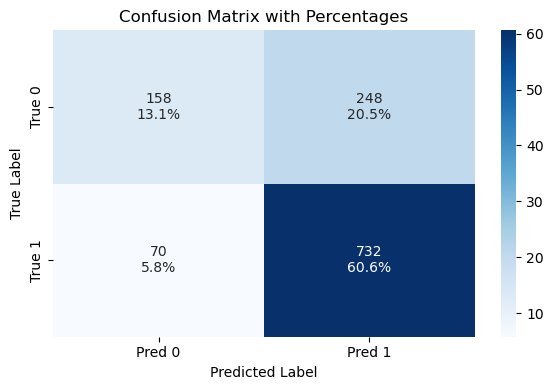

In [33]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def info_cm(y_test, y_pred):
    cm = confusion_matrix(y_test, y_pred)
    cm_sum = np.sum(cm)
    cm_percent = cm / cm_sum * 100
    
    labels = np.array([[f"{v}\n{p:.1f}%" for v, p in zip(row_val, row_pct)]
                       for row_val, row_pct in zip(cm, cm_percent)])
    
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm_percent, annot=labels, fmt='', cmap='Blues',
                xticklabels=['Pred 0', 'Pred 1'], yticklabels=['True 0', 'True 1'])
    plt.title("Confusion Matrix with Percentages")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.tight_layout()
    plt.show()

info_cm(y_test_rf, model_rf.predict(X_test_rf))  

A

In [34]:
from sklearn.ensemble import HistGradientBoostingClassifier
features_all = list(X_clean.columns)
X_clean_hg, y_clean_hg, X_train_hg, X_test_hg, y_train_hg, y_test_hg = create_data_classification(features_all, False)

The same process is repeated for the HistGradientBoostingClassifier, which is a boosting technique. Unlike Random Forest, trees are built sequentially. HistGradientBoostingClassifier was chosen because of its ability to handle NaN values, making it particularly useful for datasets like ours, especially when predicting outcomes for patients with incomplete data.
In this case, the feature matrix X includes all features. Since Random Forest is resilient to multicollinearity, no prior feature selection was performed.

In [35]:
param_grid = {
    'max_leaf_nodes': [8, 16, 32, 64],
    'max_iter': [50, 75, 100]
}
base_model = HistGradientBoostingClassifier(verbose=0, random_state=split_seed)

grid = GridSearchCV(base_model, param_grid, cv=cv, scoring='f1', n_jobs=-1)
grid.fit(X_train_hg, y_train_hg)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=42, shuffle=True),
             estimator=HistGradientBoostingClassifier(random_state=42),
             n_jobs=-1,
             param_grid={'max_iter': [50, 75, 100],
                         'max_leaf_nodes': [8, 16, 32, 64]},
             scoring='f1')

In this case, comparing the CV F1 score with Random Forest is not entirely fair, but from our perspective, HistGradientBoostingClassifier is better due to its ability to handle NaNs.

Best max_leaf_nodes: 8
Best max_iter: 100
Best cv f1 score: 0.833420570337808

Final model
Train accuracy: 0.7968149368478857
Test accuracy: 0.7561779242174629
Train f1: 0.8603510096244574
Test f1: 0.8315629742033384


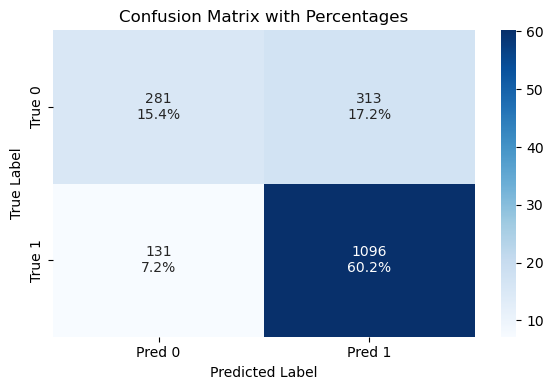

In [36]:
best_model_hg = grid.best_estimator_
print(f"Best max_leaf_nodes: {grid.best_params_['max_leaf_nodes']}")
print(f"Best max_iter: {grid.best_params_['max_iter']}")
print(f"Best cv f1 score: {grid.best_score_}")

print("\nFinal model")
model = HistGradientBoostingClassifier(
    max_iter=grid.best_params_['max_iter'],
    random_state=split_seed,
    max_leaf_nodes=grid.best_params_['max_leaf_nodes']
)
model.fit(X_train_hg, y_train_hg)
model_scores_classification(model, X_train_hg, X_test_hg, y_train_hg, y_test_hg)
info_cm(y_test_hg, model.predict(X_test_hg))    

HistGradientBoostingClassifier is less interpretable than Random Forest, as it is not possible to directly visualize the individual trees (although similar algorithms allow this). We proceed with feature selection using the permutation importance technique, both to reduce dimensionality and to facilitate interpretation of the results.

In [37]:
# Permutation importance
from sklearn.inspection import permutation_importance
result = permutation_importance(model, X_train_hg, y_train_hg, n_repeats=10, random_state=split_seed, scoring='f1')

# Create importance DataFrame
importances_df = pd.DataFrame({
    'feature': X_train_hg.columns,
    'importance_mean': result.importances_mean,
    'importance_std': result.importances_std
}).sort_values(by='importance_mean', ascending=False)

print(importances_df)

                       feature  importance_mean  importance_std
9                      avtisst         0.036006        0.001692
0                          age         0.026402        0.001250
40                       ca_no         0.013695        0.001417
5                        scoma         0.011778        0.000716
2                       num.co         0.010714        0.000950
25                         bun         0.010585        0.001483
29                       adlsc         0.009307        0.001832
10                        hday         0.003867        0.000581
39        dzgroup_MOSF w/Malig         0.003679        0.001136
41                      ca_yes         0.003483        0.000595
31              dzclass_Cancer         0.003341        0.001173
6                      charges         0.003331        0.001116
8                      totmcst         0.002417        0.000627
1                          sex         0.002414        0.000790
35           dzgroup_Cirrhosis         0

The most important features are the ones previusly discussed.

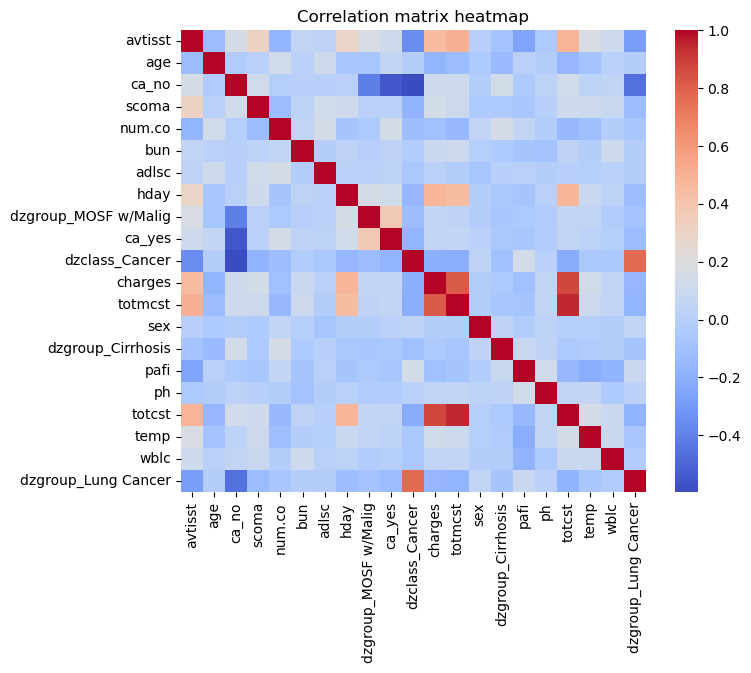

In [38]:
# feature matrix and target
features_selected = importances_df['feature'][:21] # Negative values and 0s are present as well, 21 is just a arbitrary number

X_top = X[features_selected].copy() 
y_top = train_data['target'].copy()  

scal = 0.5
plt.figure(figsize=(15*scal,12*scal))
sns.heatmap(X_top.corr(), fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Correlation matrix heatmap")
plt.show()

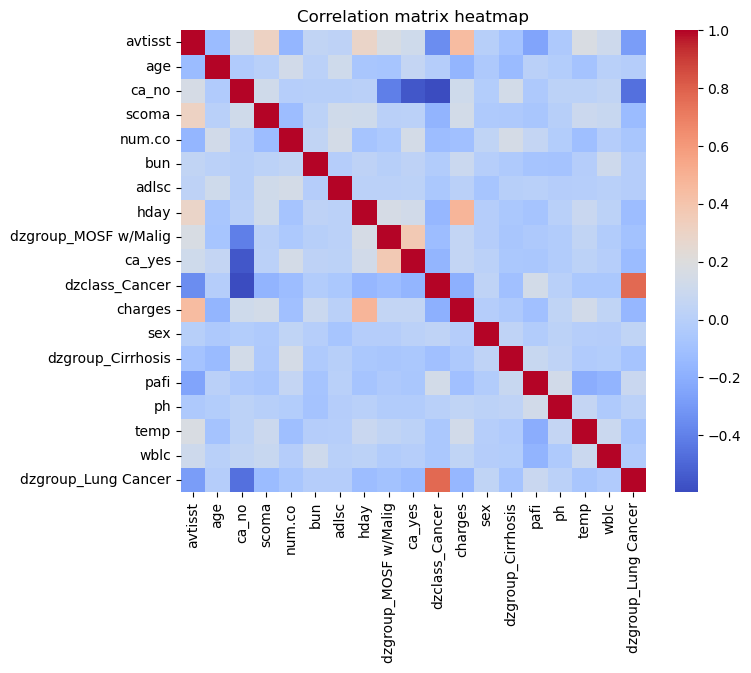

In [39]:
features_selected_2 = list(features_selected)
# elimination of strong multicollinearity
features_selected_2.remove('totmcst')
features_selected_2.remove('totcst')

plt.figure(figsize=(15*scal,12*scal))
sns.heatmap(X_top[features_selected_2].corr(), fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Correlation matrix heatmap")
plt.show()

A HistGradientBoostingClassifier model is trained (with NaNs) to evaluate how the model's performance changes compared to the previous HistGradientBoostingClassifier, that had all the features.

Cross validation f1 score: 0.8327656192478097
Train accuracy: 0.7914607358594179
Test accuracy: 0.7561779242174629
Train f1: 0.8562777935471663
Test f1: 0.8306636155606407


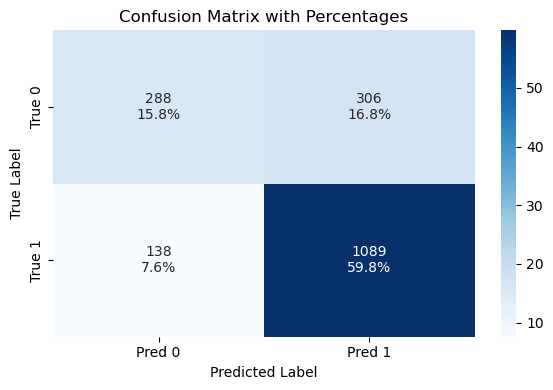

In [40]:
X_clean_hg, y_clean_hg, X_train_hg, X_test_hg, y_train_hg, y_test_hg = create_data_classification(features_selected_2, False)

model = HistGradientBoostingClassifier(max_iter=grid.best_params_['max_iter'], random_state=split_seed, max_leaf_nodes=grid.best_params_['max_leaf_nodes'])
scores = cross_val_score(model, X_train_hg, y_train_hg, cv=cv, scoring='f1', n_jobs=-1)
print("Cross validation f1 score:", scores.mean())

model.fit(X_train_hg, y_train_hg)
model_scores_classification(model, X_train_hg, X_test_hg, y_train_hg, y_test_hg)
info_cm(y_test_hg, model.predict(X_test_hg))
# BEST MODEL WITH GRID
# Best cv f1 score: 0.8328273681126317

# BEST MODEL SO FAR IF CONSIDER F1 SCORE

To have a better comparison among the models, the HistGradientBoostingClassifier is trained on the X_train_rf Random Forest dataset, and it still performs slightly better (0.83 vs 0.82).

Model on the RF (clean) dataset
Cross validation f1 score: 0.8183957100865975
Train accuracy: 0.7990703570673992
Test accuracy: 0.7450331125827815
Train f1: 0.8580808834502313
Test f1: 0.8198830409356725


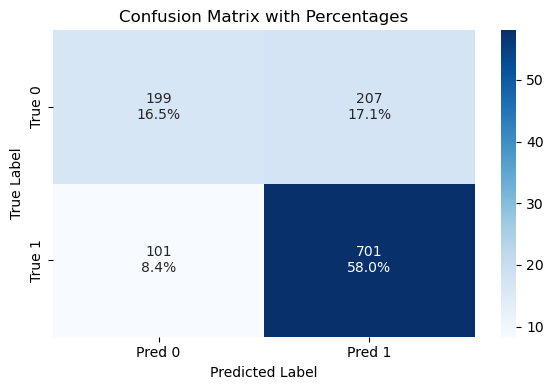

In [41]:
print("Model on the RF (clean) dataset")
model = HistGradientBoostingClassifier(max_iter=grid.best_params_['max_iter'], random_state=split_seed, max_leaf_nodes=grid.best_params_['max_leaf_nodes'])
scores = cross_val_score(model, X_train_rf, y_train_rf, cv=cv, scoring='f1', n_jobs=-1)
print("Cross validation f1 score:", scores.mean())
model.fit(X_train_rf, y_train_rf)
model_scores_classification(model, X_train_rf, X_test_rf, y_train_rf, y_test_rf)
info_cm(y_test_rf, model.predict(X_test_rf))

We tried to further reduce the number of features (which also decreased multicollinearity) while still maintaining a high CV F1 score.

Cross validation f1 score: 0.8297232017805509
Train accuracy: 0.7781438769906645
Test accuracy: 0.7616694124107634
Train f1: 0.8471144749290445
Test f1: 0.8347296268088348


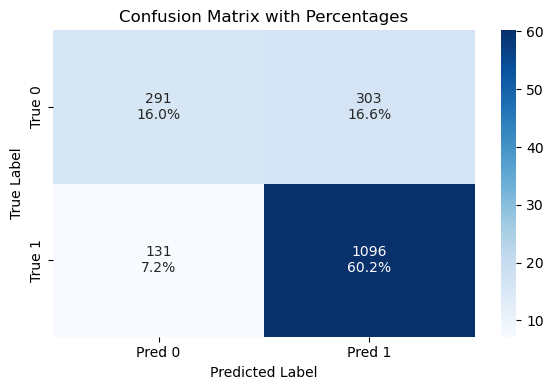

In [42]:
X_clean_hg, y_clean_hg, X_train_hg, X_test_hg, y_train_hg, y_test_hg = create_data_classification(features_selected_2[:10], False)

model = HistGradientBoostingClassifier(max_iter=grid.best_params_['max_iter'],random_state=split_seed, max_leaf_nodes=grid.best_params_['max_leaf_nodes'])
scores = cross_val_score(model, X_train_hg, y_train_hg, cv=cv, scoring='f1', n_jobs=-1)
print("Cross validation f1 score:", scores.mean())

model.fit(X_train_hg, y_train_hg)
model_scores_classification(model, X_train_hg, X_test_hg, y_train_hg, y_test_hg)
info_cm(y_test_hg, model.predict(X_test_hg))

We moved on to using KNN (with the same features and data as Random Forest, both because they are significant and to ensure a fair comparison). Since KNN suffers from high dimensionality and uses Euclidean distance, the data was scaled, and a pipeline was used to avoid data leakage.

X_train data: 4733
X_test data: 1208
Best k: 121 with CV f1: 0.8179


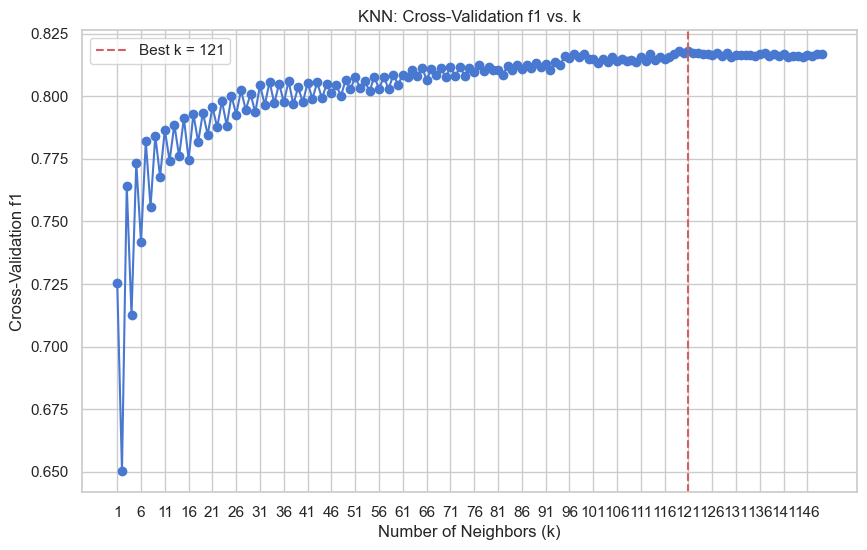

Train accuracy: 0.7329389393619269
Test accuracy: 0.7102649006622517
Train f1: 0.8224220286597359
Test f1: 0.8072687224669604


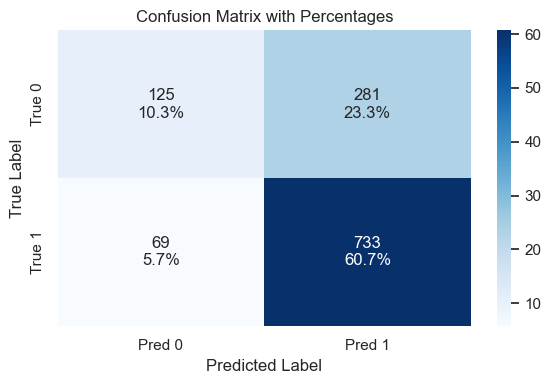

In [43]:
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import Pipeline

X_train_knn, X_test_knn, y_train_knn, y_test_knn = remove_na_classification(features, True)

k_max = 150
k_values = range(1,k_max)
cv_scores = []
for k in k_values:
    pipeline = Pipeline([
        ('scaler', StandardScaler()),
        ('knn', KNeighborsClassifier(n_neighbors=k))
    ])
    scores = cross_val_score(pipeline, X_train_knn, y_train_knn, cv=cv, scoring='f1', n_jobs=-1)
    cv_scores.append(scores.mean())

best_k = k_values[np.argmax(cv_scores)]
print(f"Best k: {best_k} with CV f1: {max(cv_scores):.4f}")

sns.set(style="whitegrid", context="notebook", palette="muted")
plt.figure(figsize=(10, 6))
plt.plot(k_values, cv_scores, marker='o')
plt.title('KNN: Cross-Validation f1 vs. k')
plt.xlabel('Number of Neighbors (k)')
plt.ylabel('Cross-Validation f1')
plt.grid(True)
plt.xticks(range(1, k_max, 5))
plt.axvline(best_k, color='r', linestyle='--', label=f'Best k = {best_k}')
plt.legend()
plt.show()

scaler = StandardScaler()
X_train_knn = scaler.fit_transform(X_train_knn)
X_test_knn = scaler.transform(X_test_knn)
model = KNeighborsClassifier(n_neighbors=best_k)
model.fit(X_train_knn, y_train_knn)

model_scores_classification(model, X_train_knn, X_test_knn, y_train_knn, y_test_knn)

y_pred = model.predict(X_test_knn)
info_cm(y_test_knn, y_pred)

Good scores were obtained, but Random Forest still performs better. The high value of k suggests that the model relies on a larger neighborhood to make decisions, which helps smooth out the effect of noise in the data.

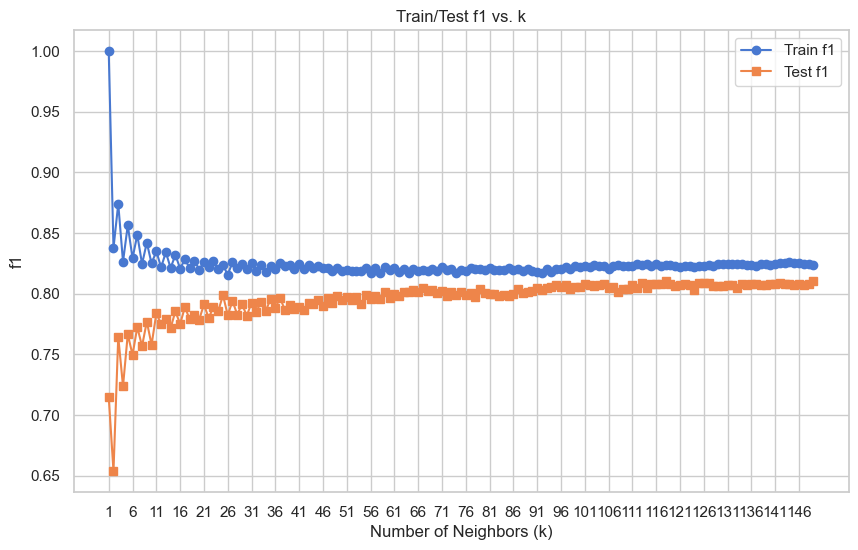

In [44]:
# Here is just a nice plot on how test and train f1 score vary with k

train_scores = []
test_scores = []

for k in k_values:
    model = KNeighborsClassifier(n_neighbors=k)
    model.fit(X_train_knn, y_train_knn)
    train_scores.append(f1_score(y_train_knn, model.predict(X_train_knn)))
    test_scores.append(f1_score(y_test_knn, model.predict(X_test_knn)))

sns.set(style="whitegrid", context="notebook", palette="muted")
plt.figure(figsize=(10, 6))
plt.plot(k_values, train_scores, label='Train f1', marker='o')
plt.plot(k_values, test_scores, label='Test f1', marker='s')
plt.title('Train/Test f1 vs. k')
plt.xlabel('Number of Neighbors (k)')
plt.ylabel('f1')
plt.grid(True)
plt.legend()
plt.xticks(range(1, k_max, 5))
plt.show()

As we don't need any strong assumption we used Logistic Regression with Lasso regularization

X_train data: 4733
X_test data: 1208
Best C: 0.08685
Mean CV F1 scpre: 0.8236726502381068


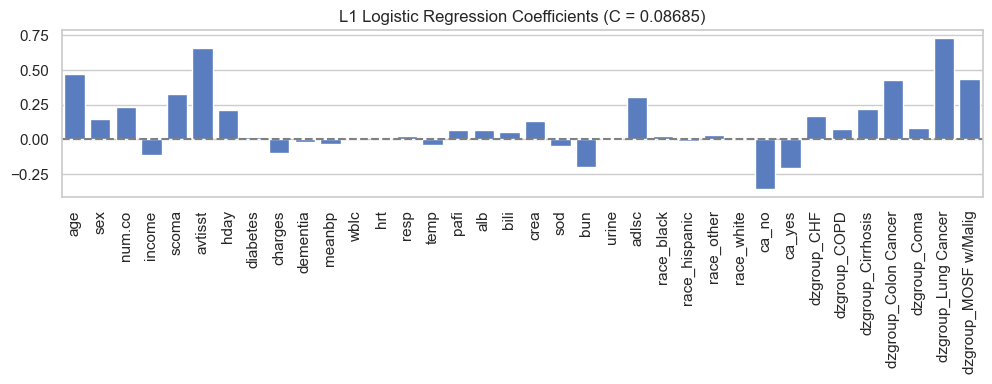

In [45]:
from sklearn.linear_model import LogisticRegression

features_lg = features.copy()
X_train_lg, X_test_lg, y_train_lg, y_test_lg = remove_na_classification(features_lg)

# Generate 50 log-spaced C values from 1e-4 to 1e4
C_values = np.logspace(-4, 4, 50)

pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('logreg', LogisticRegression(penalty='l1', solver='liblinear', max_iter=1000))
])

grid = GridSearchCV(
    estimator=pipeline,
    param_grid={'logreg__C': C_values},
    scoring='f1',
    cv=cv,
    n_jobs=-1
)
grid.fit(X_train_lg, y_train_lg)


best_C = grid.best_params_['logreg__C']
best_model = grid.best_estimator_
print(f"Best C: {best_C:.5f}")
print("Mean CV F1 scpre:", grid.best_score_)

coefs = grid.best_estimator_.named_steps['logreg'].coef_.flatten()

plt.figure(figsize=(10, 4))
sns.barplot(x=features_lg, y=coefs)
plt.axhline(0, color='gray', linestyle='--')
plt.title(f"L1 Logistic Regression Coefficients (C = {best_C:.5f})")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

The model performed better than Random Forest and is useful for feature selection, but it is less interpretable since we only get a general idea of how the features relate to the outcome. \
Another advantage of Logistic Regression is the ability to adjust the decision threshold based on the predicted probabilities, allowing us to balance the trade-off between True Positive Rate and False Positive Rate according to the specific needs of the application\physicians.

Train accuracy: 0.7534333403760828
Test accuracy: 0.734271523178808
Train f1: 0.827136720485854
Test f1: 0.8117302052785924


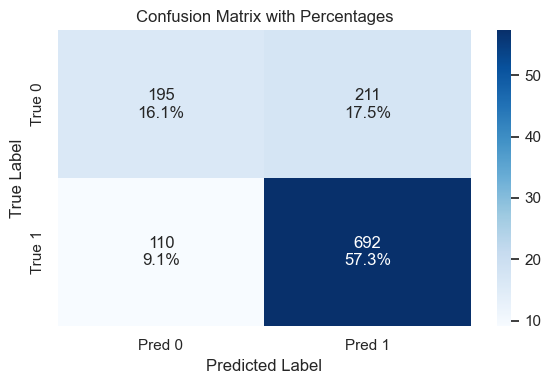

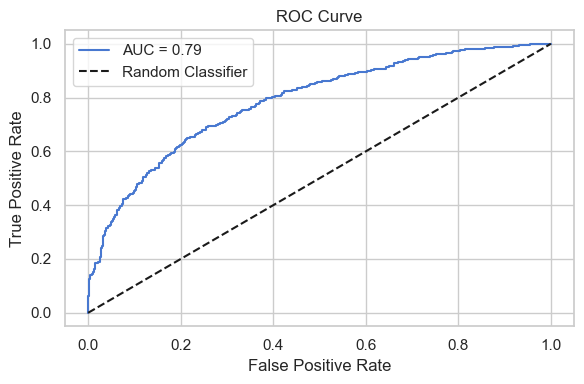

In [46]:
from sklearn.metrics import roc_curve, roc_auc_score

scaler = StandardScaler()
X_train_lg = scaler.fit_transform(X_train_lg)
X_test_lg = scaler.transform(X_test_lg)

model = LogisticRegression(
    penalty='l1', solver='liblinear', max_iter=1000,
    C=best_C
)
model.fit(X_train_lg, y_train_lg)

model_scores_classification(model, X_train_lg, X_test_lg, y_train_lg, y_test_lg)
y_pred = model.predict(X_test_lg)
y_prob = model.predict_proba(X_test_lg)[:, 1]

info_cm(y_test_lg, y_pred)

# ROC Curve
fpr, tpr, thresholds = roc_curve(y_test_lg, y_prob)
roc_auc = roc_auc_score(y_test_lg, y_prob)

plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, label=f"AUC = {roc_auc:.2f}")
plt.plot([0, 1], [0, 1], 'k--', label="Random Classifier")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

The good results from Logistic Regression lead us to believe that a soft linear margin could work well for SVM, but we also performed a grid search using a Gaussian kernel.

X_train data: 4733
X_test data: 1208
Best parameters: {'svc__C': 0.1, 'svc__kernel': 'linear'}
Best CV f1 score: 0.8265343924908878
Train accuracy: 0.7525882104373548
Test accuracy: 0.7375827814569537
Train f1: 0.8306579898770788
Test f1: 0.8187535734705546


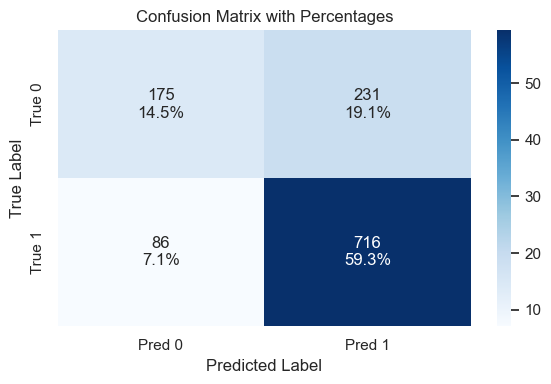

In [47]:
from sklearn.svm import SVC
from sklearn.preprocessing import RobustScaler

X_train_s, X_test_s, y_train_s, y_test_s = remove_na_classification(features_lg)

pipeline = Pipeline([
    ('scaler', RobustScaler()),  # is more robust to outlier in respect to sandard scalar
    ('svc', SVC())
])

param_grid = {
    'svc__C': [0.1, 0.5, 1, 10],
    'svc__kernel': ['linear', 'rbf']
}

grid_search = GridSearchCV(
    estimator=pipeline,
    param_grid=param_grid,
    cv=cv,               # StratifiedKFold definito precedentemente
    scoring='f1',
    n_jobs=-1
)

grid_search.fit(X_train_s, y_train_s)

print("Best parameters:", grid_search.best_params_)
print("Best CV f1 score:", grid_search.best_score_)

best_model = grid_search.best_estimator_
best_model.fit(X_train_s, y_train_s)

model_scores_classification(best_model, X_train_s, X_test_s, y_train_s, y_test_s)

y_pred = best_model.predict(X_test_s)
info_cm(y_test_s, y_pred)

The performance is very close to that of Logistic Regression, and as expected, a linear boundary was found.

In [48]:
# Get the indices of support vectors
support_indices = best_model.named_steps['svc'].support_

# Get the original (unscaled) support vectors from X_train_s
X_support = X_train_s.iloc[support_indices]

for cls, count in zip( best_model.named_steps['svc'].classes_,  best_model.named_steps['svc'].n_support_):
    print(f" Class {cls}: {count} support vectors")

# Prevent column truncation in output
with pd.option_context('display.max_columns', None, 'display.width', None):
    print("Full Support Vectors (Unscaled):\n")
    print(X_support)
y_support = y_train_s.iloc[support_indices]
X_support_labeled = X_support.copy()
X_support_labeled['label'] = y_support.values


 Class 0: 1415 support vectors
 Class 1: 1429 support vectors
Full Support Vectors (Unscaled):

           age  sex  num.co  income  scoma  avtisst  hday  diabetes   charges  \
8870  74.93994    1       0   0.375    9.0    24.50     9         0   48671.0   
8742  88.37500    0       0   0.125    0.0    17.00     1         0   10371.0   
7666  41.84000    0       1   0.125    0.0    52.75     3         0  139684.0   
8182  66.31299    1       1   0.375    0.0    13.00     9         0   14233.0   
1544  42.82797    1       1   0.875   26.0    33.00     1         0   85800.0   
...        ...  ...     ...     ...    ...      ...   ...       ...       ...   
6265  69.57697    0       5   0.375    0.0    10.50     1         1    8347.0   
5734  71.98395    0       0   0.375   41.0    39.50     8         0   94706.0   
5191  68.02496    1       2   0.125    9.0     8.00     1         0    3742.0   
5390  56.31198    1       1   0.875    9.0    18.00     1         0   46602.0   
7270  55.2909

We can clearly see that the number of support vectors is quite large compared to the total number of data points—about half of them. In Support Vector Machines, support vectors are the critical data points that define the decision margin. A high number of support vectors, roughly half of the dataset, indicates that many observations lie close to or within the decision boundary region, suggesting a more complex classification problem. This may reflect a less clear separation between classes, resulting in a more complex model that can be more sensitive to noise, potentially affecting generalization.

#### Classification conclusions
We can conclude that, excluding the HistGradientBoostingClassifier, the best performing model was L1 Logistic Regression, which also helped us successfully identify the most important features for predicting the 1994 patient outcome. Random Forest provided the best interpretability among the models. However, given our dataset is full of NaNs, the HistGradientBoostingClassifier remains the most suitable choice.

No model showed signs of overfitting.

### REGRESSION

In the following chunks of code, we recap the data and filter it for the regression task using roughly the same logic applied in the classification task.

Note: we still exclude 'sfdm2' because it contains many NaNs and is correlated due to the way it is defined.

In [49]:
from sklearn.linear_model import LinearRegression

print(y.isna().sum())
print(y.columns)
X_regression = pd.concat([X, y['hospdead']], axis=1).select_dtypes(exclude=['object', 'category'])
X_regression['sfdm2'] = y['sfdm2']
X_regression = X_regression.drop(columns=['age_r'])
bool_cols = X_regression.select_dtypes(include='bool').columns
X_regression[bool_cols] = X_regression[bool_cols].astype(float)
print(X_regression.columns)

# Too many na 'adlp', 'adls',

features = ['age', 'sex', 'num.co',  'income', 'scoma', 'edu', #'totcst', 'totmcst',  'charges',  
        'avtisst', 'hday', 'diabetes', 'dementia', 'meanbp', 'wblc',
       'hrt', 'resp', 'temp', 'pafi', 'alb', 'bili', 'crea', 'sod', #'ph','glucose',
       'bun', 'urine', 'adlsc', #'adlp', 'adls', 
       #'dzclass_COPD/CHF/Cirrhosis', 'dzclass_Cancer', 'dzclass_Coma',
       'dzgroup_CHF', 'dzgroup_COPD', 'dzgroup_Cirrhosis',
       'dzgroup_Colon Cancer', 'dzgroup_Coma', 'dzgroup_Lung Cancer',
       'dzgroup_MOSF w/Malig', 'ca_no', 'ca_yes', 'race_black',
       'race_hispanic', 'race_other', 'race_white', 'death',
       'hospdead'] # 'sfdm2'
# 'sfdm2' contains a lot of na and it's correlated for how it is defined
print(X_regression.shape)

death          0
hospdead       0
sfdm2       1400
dtype: int64
Index(['death', 'hospdead', 'sfdm2'], dtype='object')
Index(['age', 'sex', 'num.co', 'edu', 'income', 'scoma', 'charges', 'totcst',
       'totmcst', 'avtisst', 'hday', 'diabetes', 'dementia', 'meanbp', 'wblc',
       'hrt', 'resp', 'temp', 'pafi', 'alb', 'bili', 'crea', 'sod', 'ph',
       'glucose', 'bun', 'urine', 'adlp', 'adls', 'adlsc',
       'dzclass_COPD/CHF/Cirrhosis', 'dzclass_Cancer', 'dzclass_Coma',
       'dzgroup_CHF', 'dzgroup_COPD', 'dzgroup_Cirrhosis',
       'dzgroup_Colon Cancer', 'dzgroup_Coma', 'dzgroup_Lung Cancer',
       'dzgroup_MOSF w/Malig', 'ca_no', 'ca_yes', 'race_black',
       'race_hispanic', 'race_other', 'race_white', 'death', 'hospdead',
       'sfdm2'],
      dtype='object')
(9105, 49)


#### Cst Features
Clearly, totcst is correlated with the previously discussed features and other "cost features."

Recap of their meanings:

- totcst: Total ratio of costs to charges (RCC) cost is an estimate of how much the patient impacted the hospital. RCC cost is usually calculated by ward, so totcst is an approximation of the real cost.
- charges: Hospital charges, this does not provide a clear view of the cost per patient. charges is used in the formula for totcst.
- totmcst: Total Micro Cost that is the actual cost impact that the patient had on the hospital, so it is more precise than totcst.

Of course, totmcst has more NaNs than totcst because it is more expensive to calculate in terms of resources. The same applies to charges.

In [50]:
X_clean_reg_cst = X_regression[features + ['totcst'] + ['charges', 'totmcst']].copy()
X_clean_reg_cst = X_clean_reg_cst.dropna()
X_clean_reg = X_regression[features + ['totcst']].copy()
X_clean_reg = X_clean_reg.dropna()
print(X_clean_reg_cst.shape)
print(X_clean_reg.shape)

print(pd.crosstab(X['diabetes'], X['glucose'].isna()), end="\n\n")
print(pd.crosstab(X['diabetes'], X['ph'].isna()), end="\n\n")
print(pd.crosstab(X['ph'].isna(), X['glucose'].isna()), end="\n\n")

(3714, 41)
(5215, 39)
glucose   False  True 
diabetes              
0          3622   3705
1           983    795

ph        False  True 
diabetes              
0          5441   1886
1          1380    398

glucose  False  True 
ph                   
False     3475   3346
True      1130   1154



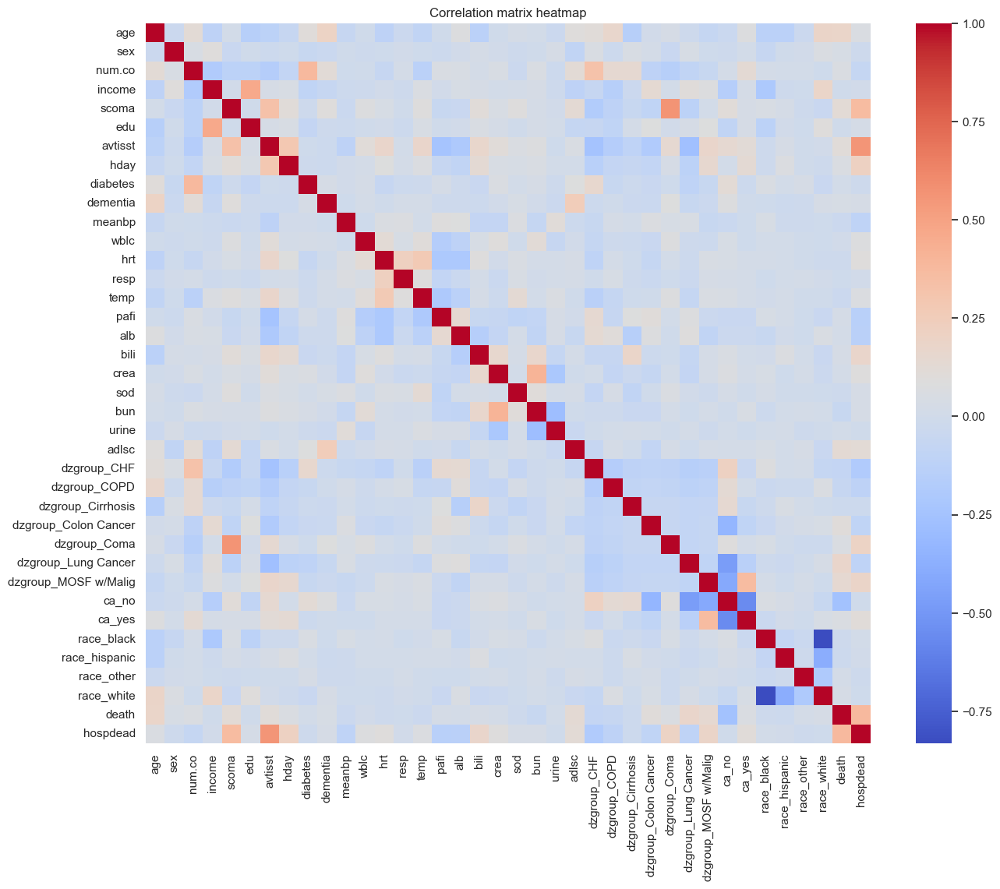

In [51]:
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
import statsmodels.api as sm
from statsmodels.stats.diagnostic import het_breuschpagan
from scipy import stats

# Recap on the correlation
corr_to_explore = X_clean_reg[features].corr()
plt.figure(figsize=(15,12))
sns.heatmap(corr_to_explore, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Correlation matrix heatmap")
plt.show()

We are trying to see how charges influence totcst, and whether there is a strong correlation between them or with any non-linear transformation of charges. Apart from the linear correlation, none of the transformations showed an obvious relationship.

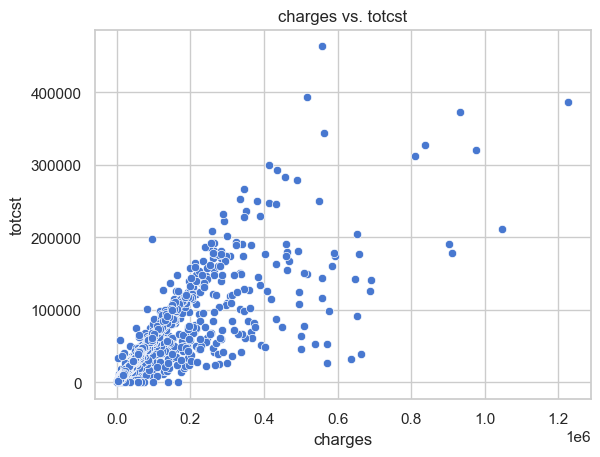

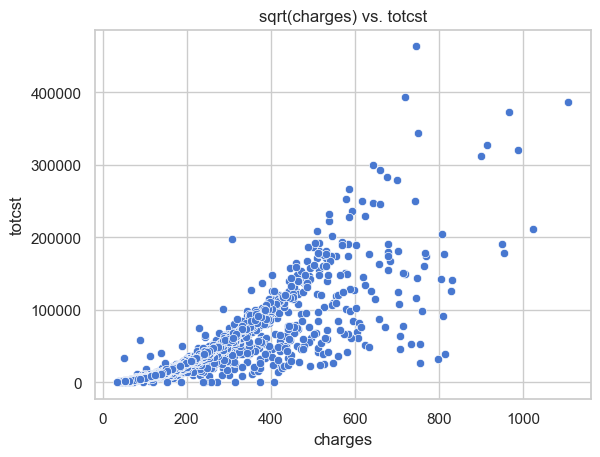

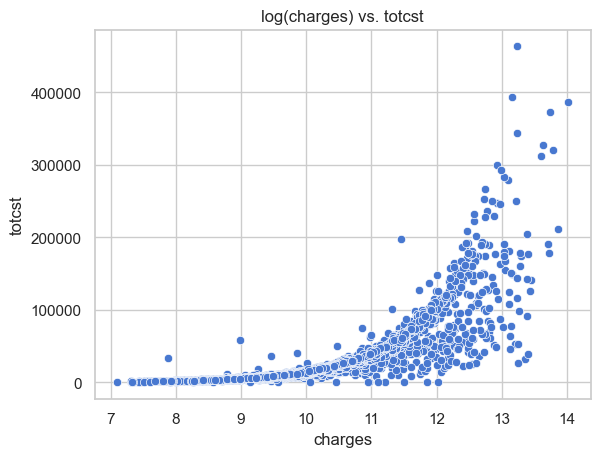

In [52]:
sns.scatterplot(data=X_clean_reg_cst, x='charges', y='totcst')
plt.title("charges vs. totcst")
plt.show()
sns.scatterplot(x=np.sqrt(X_clean_reg_cst['charges']), y=X_clean_reg_cst['totcst'])
plt.title("sqrt(charges) vs. totcst")
plt.show()
sns.scatterplot(x=np.log(X_clean_reg_cst['charges']), y=X_clean_reg_cst['totcst'])
plt.title("log(charges) vs. totcst")
plt.show()

We are starting the regression problem first without using totmcst and charges, to observe how the model performances change and to better understand the association of totcst with the other features.

For splitting the data, we used the same logic as in the classification task.

R² was preferred as the metric to explain the variance.

In [53]:
X_train_reg, X_test_reg, y_train_reg, y_test_reg = train_test_split(
    X_clean_reg[features], X_clean_reg['totcst'],
    test_size=split_test_size, random_state=split_seed
)

model = LinearRegression(fit_intercept=True) 
model.fit(X_train_reg, y_train_reg)
y_pred_test = model.predict(X_test_reg)

mse1 = mean_squared_error(y_test_reg, y_pred_test)

print(f"Test MSE: {mse1:.2f}")

train_r2 = model.score(X_train_reg, y_train_reg)
test_r2 = model.score(X_test_reg, y_test_reg)

print(f"Train R²: {train_r2:.2f}")
print(f"Test R²: {test_r2:.2f}")

Test MSE: 1615327228.32
Train R²: 0.42
Test R²: 0.34


{'Lagrange multiplier statistic': np.float64(112.91922596635389), 'p-value': np.float64(2.326349237998627e-09), 'f-value': np.float64(3.207726571355044), 'f p-value': np.float64(5.48815598401153e-10)}


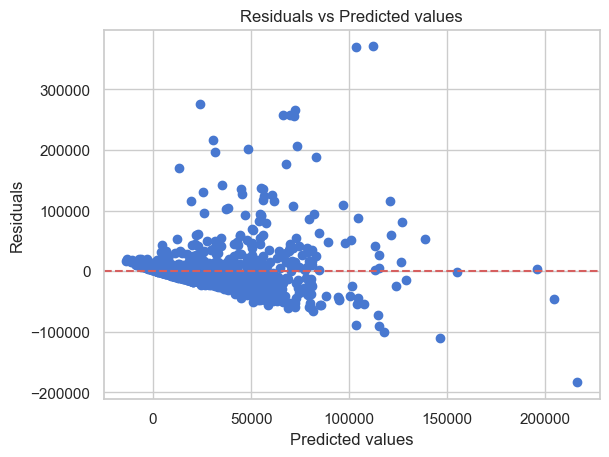

mean residuals: 1499.7804004621553


In [54]:
def info_r_2(y_train, y_train_pred, y_test, y_test_pred):
    r2_train = r2_score(y_train, y_train_pred)
    r2_test = r2_score(y_test, y_test_pred)
    
    print(f"Training R²: {r2_train:.3f}")
    print(f"Test R²: {r2_test:.3f}")
    print(f"Difference (overfitting check): {r2_train - r2_test:.3f}")

def info_residuals(y_test, y_test_pred):
    residuals = y_test - y_test_pred
    plt.scatter(y_test_pred, residuals)
    plt.axhline(y=0, color='r', linestyle='--')
    plt.xlabel('Predicted values')
    plt.ylabel('Residuals')
    plt.title('Residuals vs Predicted values')
    plt.show()
    
    print("mean residuals:", np.mean(residuals)) # => sovraestimation of the cost

residuals = y_test_reg - y_pred_test

bp_test = het_breuschpagan(residuals, sm.add_constant(X_test_reg))
labels = ['Lagrange multiplier statistic', 'p-value', 'f-value', 'f p-value']
print(dict(zip(labels, bp_test))) # low p-value indicates heteroscedasticity

info_residuals(y_test_reg, y_pred_test)


In [55]:
print(f"Number of zeros: {(X_clean_reg['totcst'] == 0).sum()}")
print(f"Minimum value: {X_clean_reg['totcst'].min()}")
print(f"Maximum value: {X_clean_reg['totcst'].max()}")
print(f"Median value: {X_clean_reg['totcst'].median()}")

print("\nValues near zero:")
print(X_clean_reg['totcst'].value_counts().head(10).sort_index())

Number of zeros: 14
Minimum value: 0.0
Maximum value: 483556.25
Median value: 13606.3359

Values near zero:
totcst
0.0000         14
2965.9512       1
8705.5938       2
9706.6719       2
12751.7344      1
17528.4375      1
28262.7031      1
103090.4380     1
288592.2500     1
304749.2500     1
Name: count, dtype: int64


We can clearly see that the residuals are heteroscedastic. We tried some non-linear transformations, but no better results were achieved. This is also due to the high number of outliers; as we already mentioned, totcst is not a precise measurement.

Sqrt trasformed:
Training R²: 0.393
Test R²: 0.301
Difference (overfitting check): 0.093

Log traformed:
Training R²: -1.782
Test R²: -0.044
Difference (overfitting check): -1.739


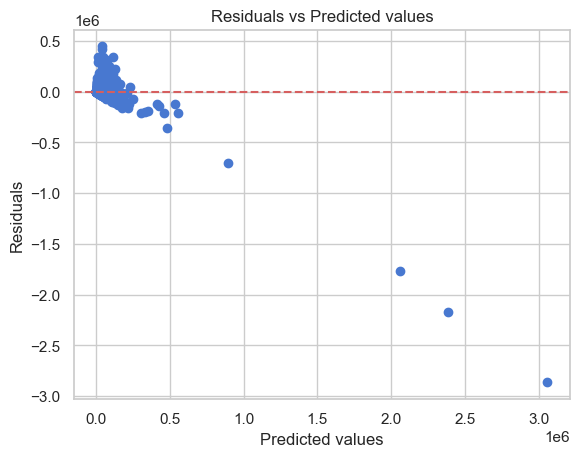

mean residuals: 5193.494258432605


In [56]:
print("Sqrt trasformed:")
model = LinearRegression()
y_train_s = np.sqrt(y_train_reg)
y_test_s = np.sqrt(y_test_reg)

model.fit(X_train_reg, y_train_s)
y_pred_s = model.predict(X_test_reg)
y_train_pred_s = model.predict(X_train_reg)
y_test_pred_s = model.predict(X_test_reg)

y_train_pred = y_train_pred_s**2
y_test_pred = y_test_pred_s**2

info_r_2(y_train_reg, y_train_pred, y_test_reg, y_test_pred)

print("\nLog traformed:")
model = LinearRegression()
y_train_log = np.log1p(y_train_reg)
y_test_log = np.log1p(y_test_reg)

model.fit(X_train_reg, y_train_log)
y_pred_log = model.predict(X_test_reg)
y_train_pred_log = model.predict(X_train_reg)
y_test_pred_log = model.predict(X_test_reg)

y_train_pred = np.expm1(y_train_pred_log)
y_test_pred = np.expm1(y_test_pred_log)

info_r_2(y_train_reg, y_train_pred, y_test_reg, y_test_pred)
info_residuals(y_train_reg, y_train_pred)

We used Lasso to identify the most relevant features. The data were scaled to ensure that all features contribute equally to the model and to improve convergence.\
KFold cross-validation was set.

The results were decent, but we weren’t able to properly explain the outliers of totcst, as is expected from a regression model.

Best alpha: 174.7528400007683
CV R^2: 0.40681327519476085


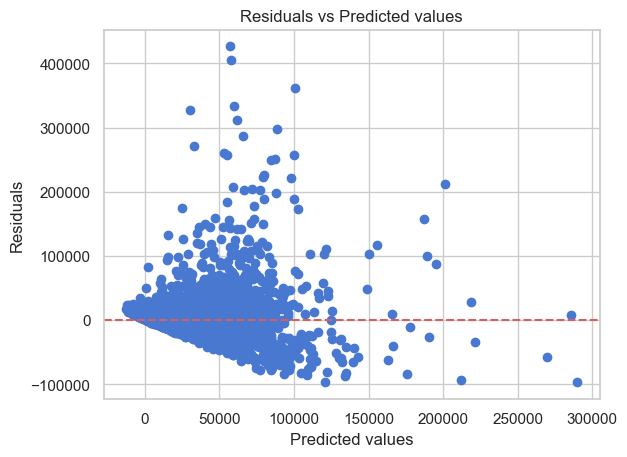

mean residuals: 3.313595270121886e-12
Training R²: 0.421
Test R²: 0.341
Difference (overfitting check): 0.080


In [57]:
from sklearn.linear_model import Lasso
from sklearn.model_selection import KFold

cv_reg = KFold(n_splits=10, shuffle=True, random_state=split_seed)

X_train_reg, X_test_reg, y_train_reg, y_test_reg = train_test_split(
    X_clean_reg[features],
    X_clean_reg['totcst'],
    test_size=split_test_size,
    random_state=split_seed
)

pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('lasso', Lasso(max_iter=10000))
])

param_grid = {
    'lasso__alpha': np.logspace(-2, 4, 100)
}

grid = GridSearchCV(
    estimator=pipeline,
    param_grid=param_grid,
    cv=cv_reg,
    scoring='r2',
    n_jobs=-1
)

grid.fit(X_train_reg, y_train_reg)

best_alpha = grid.best_params_['lasso__alpha']
print("Best alpha:", best_alpha)
print("CV R^2:",  grid.best_score_)

final_model =  grid.best_estimator_
final_model.fit(X_train_reg, y_train_reg)

y_train_pred = final_model.predict(X_train_reg)
y_test_pred = final_model.predict(X_test_reg)

info_residuals(y_train_reg, y_train_pred)
info_r_2(y_train_reg, y_train_pred, y_test_reg, y_test_pred)

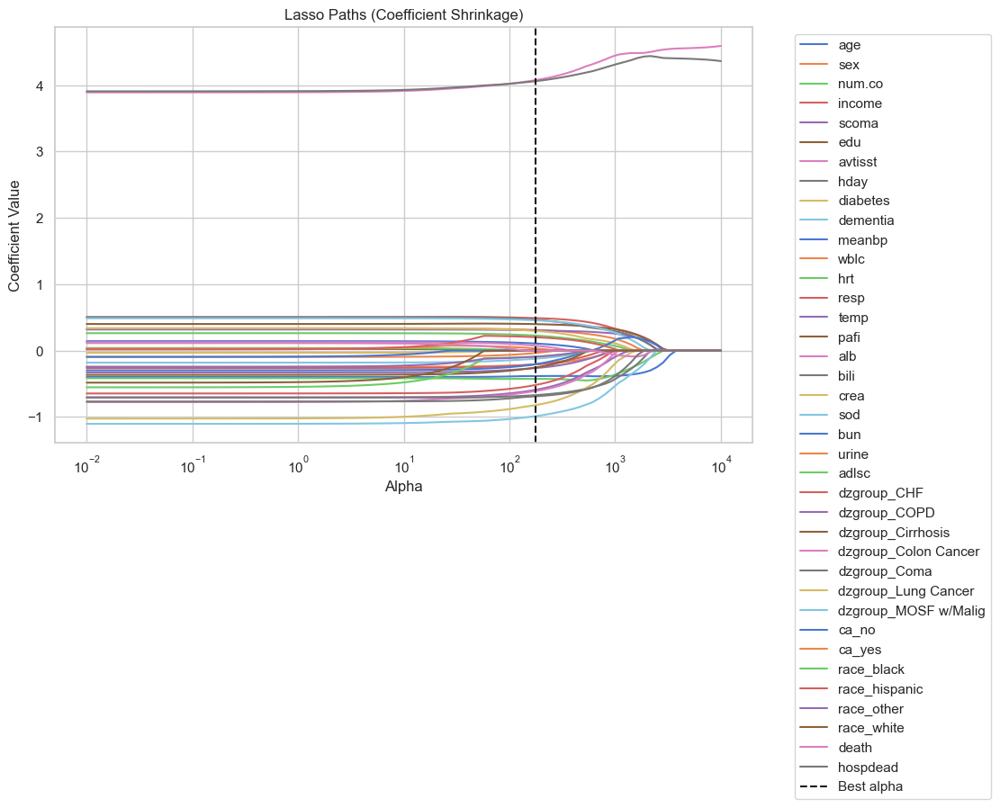

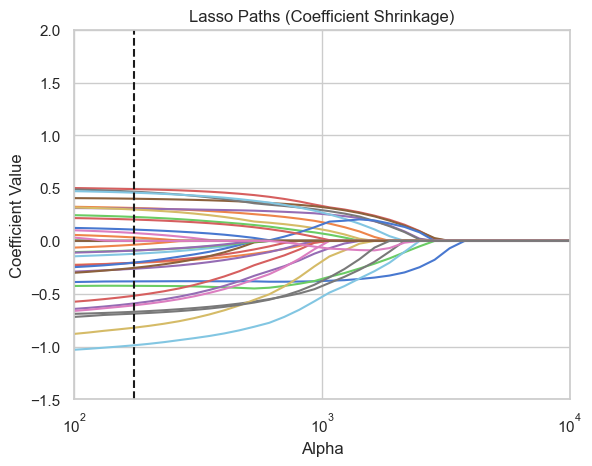

                 Feature   Coefficient
0                    age  -1509.333201
1                    sex   -822.987997
2                 num.co  -1675.838973
3                 income   1931.953131
4                  scoma  -1039.140984
5                    edu   1573.113615
6                avtisst  16045.102530
7                   hday  15986.982375
8               diabetes     -0.000000
9               dementia   -482.796433
10                meanbp    422.936616
11                  wblc   1228.058774
12                   hrt    893.636385
13                  resp   -812.203858
14                  temp   1204.880201
15                  pafi      0.000000
16                   alb    294.393295
17                  bili   1836.030168
18                  crea   1170.397462
19                   sod   1797.379652
20                   bun   -810.262248
21                 urine   -142.951065
22                 adlsc      0.000000
23           dzgroup_CHF  -2045.514981
24          dzgroup_COPD 

In [58]:
from sklearn.linear_model import lasso_path

def info_lasso(X_train, y_train, feature_names, best_alpha, model):
    
    alphas_lasso, coefs_lasso, _ = lasso_path(X_train, y_train, alphas=np.logspace(-2, 4, 100), max_iter=10000)
    plt.figure(figsize=(10, 6))
    scaler_coeff = StandardScaler(with_mean=False)
    coeff_scaled = scaler_coeff.fit_transform(coefs_lasso)
    
    for i in range(coeff_scaled.shape[0]):
        plt.plot(alphas_lasso, coeff_scaled[i], label=feature_names[i])
    plt.xscale('log')
    plt.xlabel('Alpha')
    plt.ylabel('Coefficient Value')
    plt.title('Lasso Paths (Coefficient Shrinkage)')
    plt.axis('tight')
    plt.grid(True)
    plt.axvline(x=best_alpha, color='k', linestyle='--', label='Best alpha')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    
    for i in range(coeff_scaled.shape[0]):
        plt.plot(alphas_lasso, coeff_scaled[i], label=feature_names[i])
    plt.xscale('log')
    plt.xlabel('Alpha')
    plt.ylabel('Coefficient Value')
    plt.title('Lasso Paths (Coefficient Shrinkage)')
    plt.axis('tight')
    plt.grid(True)
    plt.axvline(x=best_alpha, color='k', linestyle='--', label='Best alpha')
    plt.ylim(-1.5, 2)
    plt.xlim(100, 10000)
    plt.show()
    
    ## avtisst high
    ## hday high
    coef_df = pd.DataFrame({
        'Feature': feature_names,
        'Coefficient': model.coef_
    })
    print(coef_df)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_reg)
info_lasso(X_train_scaled, y_train_reg, features, best_alpha, final_model.named_steps['lasso'])

The Lasso coefficients were plotted against varying values of alpha. The coefficients were standardized in the plots for better visualization. We can clearly see that, since we did not include the features related to costs, the feature coefficients do not shrink quickly. Among them, avtisst and hday contribute the most to predicting totcst, which makes sense because IUC and MIUC are expensive, and the more days a patient spends in the hospital, the higher the cost will be.

We can also note that variables indicating severe patient conditions tend to contribute negatively to totcst, as these patients are likely to die sooner. Some of these variables include hospdead (probably indicating patients who died whitout long treatments), age, num.co, and severe dz_group conditions. race_black and sex also show some contribution, but no trivial conclusions can be drawn for these last two.

Now we include 'charges' and 'totmcst'.

Best alpha: 151.99110829529332
CV R^2: 0.855257293994654


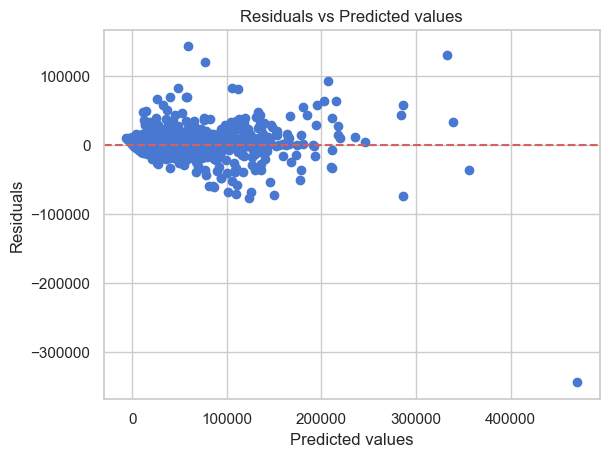

mean residuals: -6.367381284711177e-14
Training R²: 0.892
Test R²: 0.939
Difference (overfitting check): -0.047


In [59]:
features_with_cst = features + ['charges', 'totmcst']

X_train_reg, X_test_reg, y_train_reg, y_test_reg = train_test_split(
    X_clean_reg_cst[features_with_cst],
    X_clean_reg_cst['totcst'],
    test_size=split_test_size,
    random_state=split_seed
)

grid.fit(X_train_reg, y_train_reg)

best_alpha = grid.best_params_['lasso__alpha']
print("Best alpha:", best_alpha)
print("CV R^2:",  grid.best_score_)

final_model =  grid.best_estimator_
final_model.fit(X_train_reg, y_train_reg)

y_train_pred = final_model.predict(X_train_reg)
y_test_pred = final_model.predict(X_test_reg)

info_residuals(y_train_reg, y_train_pred)
info_r_2(y_train_reg, y_train_pred, y_test_reg, y_test_pred)

Training R²: 0.892
Test R²: 0.939
Difference (overfitting check): -0.047


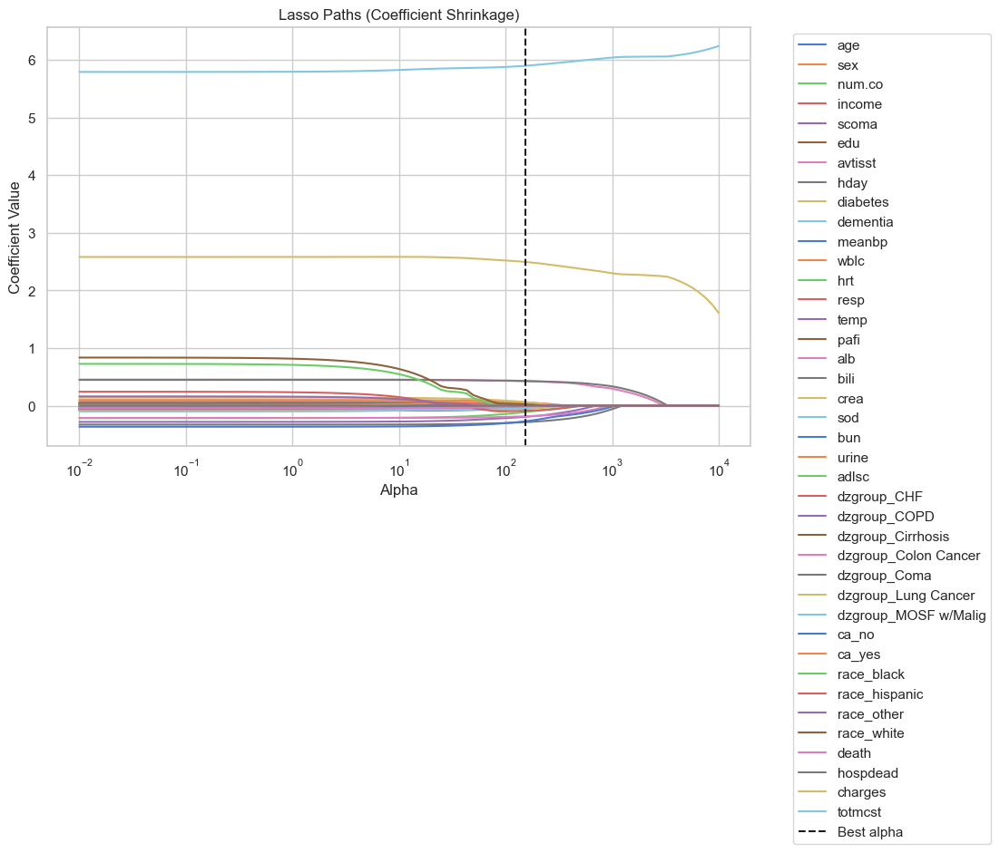

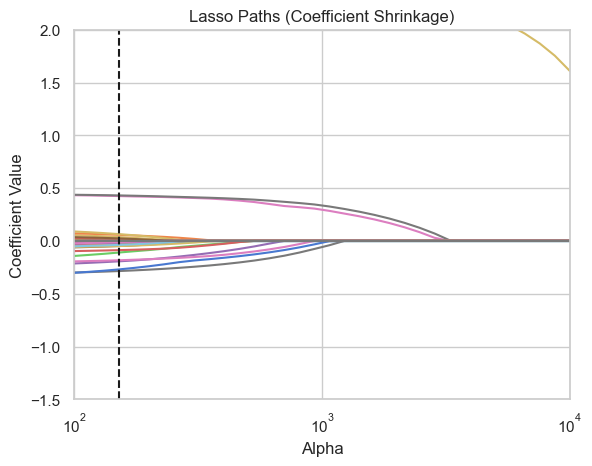

                 Feature   Coefficient
0                    age     11.819220
1                    sex      1.066252
2                 num.co   -473.225634
3                 income      0.000000
4                  scoma   -827.031017
5                    edu   -208.249257
6                avtisst   1815.935196
7                   hday   1841.206439
8               diabetes    155.683121
9               dementia     -0.000000
10                meanbp     -0.000000
11                  wblc    246.706139
12                   hrt      0.000000
13                  resp    -15.286061
14                  temp    -47.965559
15                  pafi    -44.764768
16                   alb   -785.224425
17                  bili  -1222.233857
18                  crea    276.335018
19                   sod     -0.000000
20                   bun  -1156.802797
21                 urine   -138.276514
22                 adlsc      3.218865
23           dzgroup_CHF     35.330836
24          dzgroup_COPD 

In [60]:
info_r_2(y_train_reg, y_train_pred, y_test_reg, y_test_pred)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_reg)
info_lasso(X_train_scaled, y_train_reg, features_with_cst, best_alpha, final_model.named_steps['lasso'])

Now we can clearly see how the coefficients of the other features shrink faster, and that totmcst is the most important feature as expected, followed by charges. Note that the cross-validated R² is now 0.878, meaning we have explained the majority of the variance.

Residual heteroscedasticity appears to be reduced, likely because totmcst and charges can themselves derived from totcst through some non-linear transformation or calculation.

We decided to add non-linear transformations of charges and totmcst to investigate which types of non-linearities might be implicitly present in the way totcst could be computed from these variables (charges is in the true formula).

Best alpha: 351.11917342151344
CV R^2: 0.8606587505214647


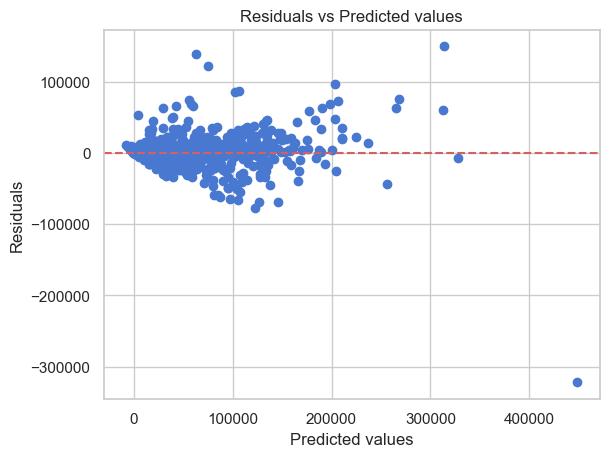

mean residuals: -5.73064315624006e-13
Training R²: 0.895
Test R²: 0.943
Difference (overfitting check): -0.047


In [61]:
X_poly = X_clean_reg_cst.copy()
X_poly['charges^2'] = X_poly['charges']**2
X_poly['charges^1/2'] = np.sqrt(X_poly['charges'])
X_poly['totmcst^1/2'] = np.sqrt(X_poly['totmcst'])
features_poly = features_with_cst + ['charges^2', 'charges^1/2', 'totmcst^1/2']


X_train_reg, X_test_reg, y_train_reg, y_test_reg = train_test_split(
    X_poly[features_poly],
    X_poly['totcst'],
    test_size=split_test_size,
    random_state=split_seed
)

grid.fit(X_train_reg, y_train_reg)

best_alpha = grid.best_params_['lasso__alpha']
print("Best alpha:", best_alpha)
print("CV R^2:",  grid.best_score_)

final_model =  grid.best_estimator_
final_model.fit(X_train_reg, y_train_reg)

y_train_pred = final_model.predict(X_train_reg)
y_test_pred = final_model.predict(X_test_reg)

info_residuals(y_train_reg, y_train_pred)
info_r_2(y_train_reg, y_train_pred, y_test_reg, y_test_pred)

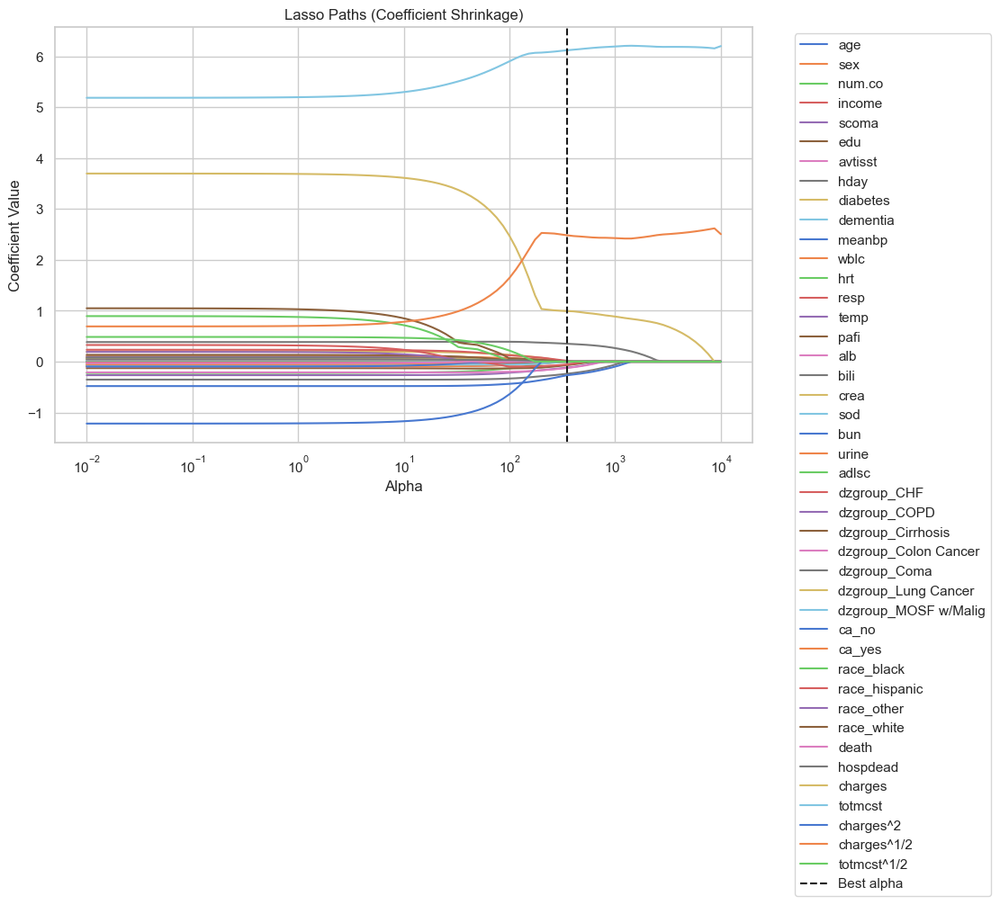

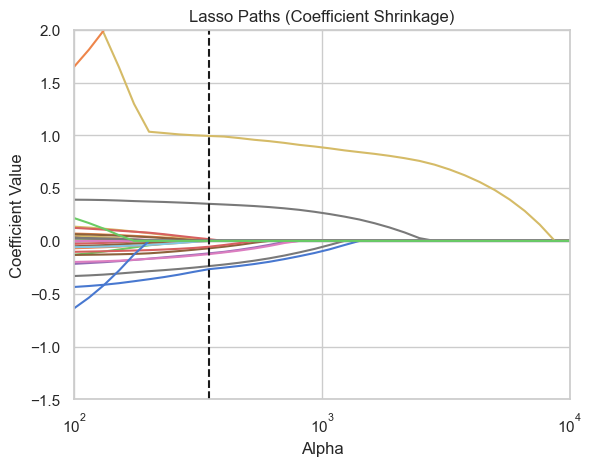

                 Feature   Coefficient
0                    age      0.000000
1                    sex      0.000000
2                 num.co     -0.000000
3                 income     -0.000000
4                  scoma   -455.527444
5                    edu   -270.199554
6                avtisst      0.000000
7                   hday   1356.703352
8               diabetes      0.000000
9               dementia     -0.000000
10                meanbp     -0.000000
11                  wblc      0.000000
12                   hrt      0.000000
13                  resp     -0.000000
14                  temp     -0.000000
15                  pafi     -0.000000
16                   alb   -483.093055
17                  bili   -922.651606
18                  crea      0.000000
19                   sod     -0.000000
20                   bun  -1033.470077
21                 urine     -0.000000
22                 adlsc      0.000000
23           dzgroup_CHF     63.100603
24          dzgroup_COPD 

In [62]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_reg)
info_lasso(X_train_scaled, y_train_reg, features_poly, best_alpha, final_model.named_steps['lasso'])

As done before, we applied Lasso to evaluate the importance of the features, this time including non-linear transformations of charges and totmcst. We observed that:
- The square root of charges has a large positive coefficient,
- The square root of totmcst also contributes positively,
- The squared charges term was discarded by Lasso.

This suggests that non-linear transformations, especially square roots, may be implicitly involved in the way totcst is derived, which aligns with our previous assumption that its computation is not purely linear.

At this point, the coefficients of the remaining features shrink even more rapidly, making them harder to interpret or justify in the presence of such strong predictors. This reinforces the idea that totmcst (and its transformation) contains most of the signal needed to estimate totcst.

Importantly, the model still shows no signs of overfitting, which confirms that we are moving in the right direction, even as we increase model complexity with non-linear terms.

In [63]:
coef_df = pd.DataFrame({
        'Feature': features_poly,
        'Coefficient': final_model.named_steps['lasso'].coef_
    })
non_zero_coef = coef_df[coef_df['Coefficient'] != 0]
print(non_zero_coef)

          Feature   Coefficient
4           scoma   -455.527444
5             edu   -270.199554
7            hday   1356.703352
16            alb   -483.093055
17           bili   -922.651606
20            bun  -1033.470077
23    dzgroup_CHF     63.100603
33  race_hispanic   -212.665008
38        charges   3841.818214
39        totmcst  23666.359403
41    charges^1/2   9604.275627


A final linear model is trained with the selected features

CV Mean R²: 0.86


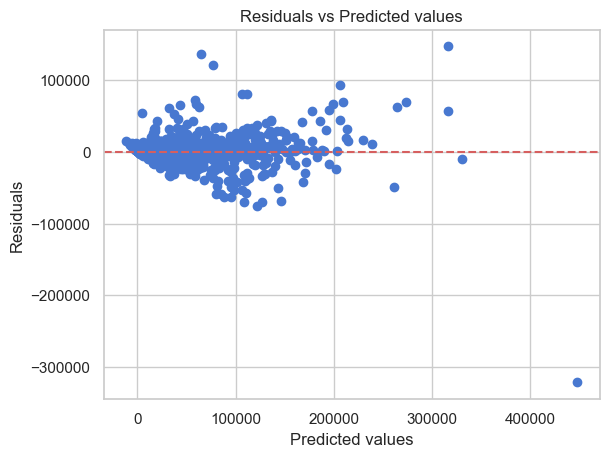

mean residuals: -3.2914463256353163e-12
Training R²: 0.896
Test R²: 0.943
Difference (overfitting check): -0.046


In [64]:
final_linear_model = LinearRegression()
X_train_f = X_train_reg[non_zero_coef['Feature']]
X_test_f = X_test_reg[non_zero_coef['Feature']]
scores = cross_val_score(final_linear_model, X_train_f, y_train_reg, cv=cv_reg, scoring='r2')
print(f"CV Mean R²: {scores.mean():.2f}")

final_linear_model.fit(X_train_f, y_train_reg)
y_train_pred = final_linear_model.predict(X_train_f)
y_test_pred = final_linear_model.predict(X_test_f)

info_residuals(y_train_reg, y_train_pred)
info_r_2(y_train_reg, y_train_pred, y_test_reg, y_test_pred)

In addition to the linear Lasso model, we also trained a RandomForestRegressor, which produced excellent results. This confirms the presence of non-linear relationships between the features and the target variable totcst that the linear model cannot fully capture.

By examining the feature importances from the Random Forest, we found a consistent pattern with the Lasso results: variables like totmcst, charges, and their related transformations or proxies remain the most influential predictors. This consistency reinforces our understanding of which features truly drive the cost and supports the use of models capable of capturing both linear and non-linear effects.

Note how the residuals have a significat decrease in heteroscedasticity.

Best parameters: {'max_depth': 10, 'n_estimators': 100}
CV R^2: 0.9271230587036563


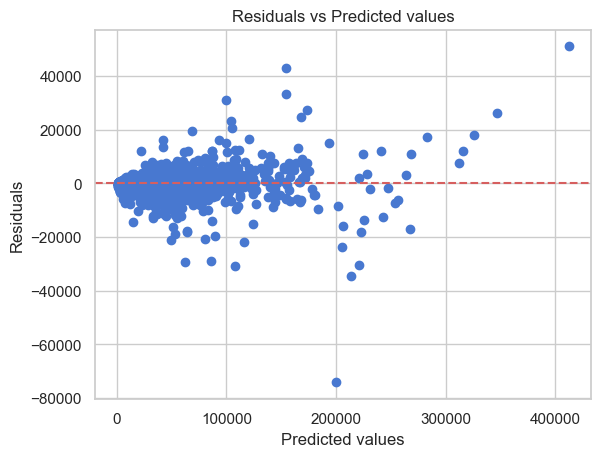

mean residuals: -77.49572910248854
Training R²: 0.990
Test R²: 0.956
Difference (overfitting check): 0.034


In [65]:
from sklearn.ensemble import RandomForestRegressor

X_train_reg, X_test_reg, y_train_reg, y_test_reg = train_test_split(
    X_clean_reg_cst[features_with_cst],
    X_clean_reg_cst['totcst'],
    test_size=split_test_size,
    random_state=split_seed
)

base_model = RandomForestRegressor(random_state=split_seed)

param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20],
}

grid = GridSearchCV(
    estimator=base_model,
    param_grid=param_grid,
    cv=cv_reg,
    scoring='r2',
    n_jobs=-1,
    verbose=0
)

grid.fit(X_train_reg, y_train_reg)

print("Best parameters:", grid.best_params_)
print("CV R^2:", grid.best_score_)

final_model = grid.best_estimator_
final_model.fit(X_train_reg, y_train_reg)

y_train_pred = final_model.predict(X_train_reg)
y_test_pred = final_model.predict(X_test_reg)

info_residuals(y_train_reg, y_train_pred)
info_r_2(y_train_reg, y_train_pred, y_test_reg, y_test_pred)


In [66]:

# Feature importances
rf_model = final_model
importances = rf_model.feature_importances_

# Create a DataFrame with importances
importance_df = pd.DataFrame({
    'Feature': features_with_cst,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

print("\nFeature Importances:")
print(importance_df)


Feature Importances:
                 Feature  Importance
39               totmcst    0.757925
38               charges    0.195202
20                   bun    0.008474
7                   hday    0.006062
19                   sod    0.003884
18                  crea    0.002248
10                meanbp    0.002178
13                  resp    0.002163
15                  pafi    0.002156
11                  wblc    0.001965
0                    age    0.001951
17                  bili    0.001887
5                    edu    0.001762
6                avtisst    0.001597
22                 adlsc    0.001345
21                 urine    0.001213
16                   alb    0.001200
14                  temp    0.001175
12                   hrt    0.001068
2                 num.co    0.001050
3                 income    0.000679
1                    sex    0.000580
4                  scoma    0.000335
32            race_black    0.000281
37              hospdead    0.000243
23           dzg

#### CLUSTERING

For the clustering task, we selected a subset of the variables based on the previous analyses (lower collinearity). To ease the variable selection task and the removal of NAs, we decided to exclude both 'income' and 'totcst'. We proceeded then by dropping adding the external label variable ('sfdm2') to make sure that, when dropping the NAs, both the rows of the input variables and of the external label would be aligned. We did not drop all the NA present in the 'sfdm2' variable yet. 
Since this is an unsupervised task, we then dropped the external label 'sfdm2' and assigned it to another variable.

For this analysis, we decided to make two distinct choices: for the first one, we performed the analyses using both numerical variables and categorical variables scaled together. For the second choice, to try a different way of scaling, we decided to scale only the numerical variables and to leave the categorical variables (done with one-hot encoding) as they were. Throughout these clustering analyses, the data for the scaled numerical and unscaled categorical variables corresponds to the X_combined variable.

In [67]:
X = pd.concat([X, y['hospdead']], axis=1)

print(y['sfdm2'].value_counts().sort_index())
print(f"\nMissing sfdm2 values: {y['sfdm2'].isnull().sum()}")
print(f"Percentage missing: {y['sfdm2'].isnull().sum()/len(y)*100:.2f}%")

print("\nsfdm2 Summary Statistics:")
print(y['sfdm2'].describe())
print(X)

sfdm2
<2 mo. follow-up       3123
Coma or Intub            41
SIP>=30                 564
adl>=4 (>=5 if sur)     916
no(M2 and SIP pres)    3061
Name: count, dtype: int64

Missing sfdm2 values: 1400
Percentage missing: 15.38%

sfdm2 Summary Statistics:
count                 7705
unique                   5
top       <2 mo. follow-up
freq                  3123
Name: sfdm2, dtype: object
           age  sex            dzgroup             dzclass  num.co   edu  \
0     62.84998    1        Lung Cancer              Cancer       0  11.0   
1     60.33899    0          Cirrhosis  COPD/CHF/Cirrhosis       2  12.0   
2     52.74698    0          Cirrhosis  COPD/CHF/Cirrhosis       2  12.0   
3     42.38498    0        Lung Cancer              Cancer       2  11.0   
4     79.88495    0  ARF/MOSF w/Sepsis            ARF/MOSF       1   NaN   
...        ...  ...                ...                 ...     ...   ...   
9100  66.07300    1  ARF/MOSF w/Sepsis            ARF/MOSF       1   8.0   
910

In [68]:
features_clust = ['age', 'num.co', 'scoma','charges','avtisst', 'hday', #income is categorical but ordinal
                'meanbp', 'wblc', 'hrt', 'resp', 'temp', 'pafi', #totcst
                'alb', 'bili', 'crea', 'sod', 'bun', 'urine', 'death', 'hospdead', 'sex', 'edu', 'diabetes', 'dementia', 'adlsc', 
                'dzgroup_CHF', 'dzgroup_COPD', 'dzgroup_Cirrhosis',
                'dzgroup_Colon Cancer', 'dzgroup_Coma', 'dzgroup_Lung Cancer',
                'dzgroup_MOSF w/Malig', 'ca_no', 'ca_yes', 'race_black', 'race_hispanic', 'race_other', 'race_white']

X_features = X[features_clust].copy()
X_features['sfdm2'] = y['sfdm2'].copy()
X_features_clean = X_features.dropna()
y_clean = X_features_clean['sfdm2']
X_features_clean = X_features_clean.drop(columns='sfdm2')

bool_cols = X_features_clean.select_dtypes(include='bool').columns
X_features_clean[bool_cols] = X_features_clean[bool_cols].astype(float)

Our data is highly dimensional and one of the techniques that can be applied to reduce the dimensionality of the data is Principal Component Analysis. Although it's supposed to work better with numerical (continuous) data (and to not perform as well with categorical data, which we have a lot of), we employed it anyways before proceeding with clustering methods such as K means and hierarchical clustering.
Before starting with PCA, we also decided to scale our data.
In the first plot, the elbow plot for the proportion of variance explained is visible. We can see the number of principal components that explain 90% of the variance. 
Conversely, in the second plot, the principal components that explain at least 2% of the variance have been selected.

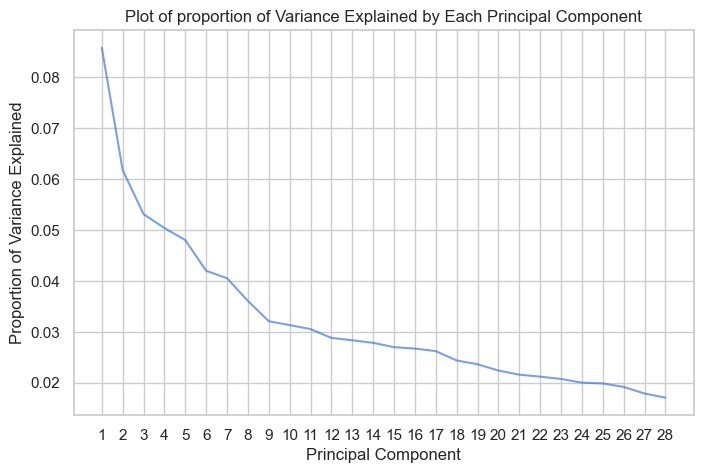

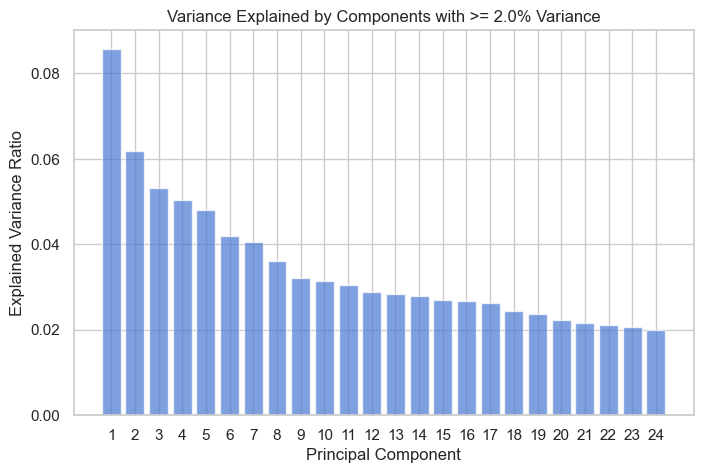

In [69]:
from sklearn.decomposition import PCA

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_features_clean)
pca = PCA(n_components=0.90)
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(8, 5))
components = range(1, len(pca.explained_variance_ratio_) + 1)
plt.plot(components, pca.explained_variance_ratio_, alpha=0.7)
plt.xlabel('Principal Component')
plt.ylabel('Proportion of Variance Explained')
plt.title('Plot of proportion of Variance Explained by Each Principal Component')
plt.xticks(components)
plt.show()

threshold = 0.02
explained_variance = pca.explained_variance_ratio_
filtered_indices = [i for i, var in enumerate(explained_variance) if var >= threshold]
filtered_components = [i + 1 for i in filtered_indices]
filtered_variance = [explained_variance[i] for i in filtered_indices]
plt.figure(figsize=(8, 5))
plt.bar(filtered_components, filtered_variance, alpha=0.7)
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title(f'Variance Explained by Components with >= {threshold*100}% Variance')
plt.xticks(filtered_components)
plt.show()

After PCA, we continued by performing hierarchical clustering. To do an exploratory analysis, we also decided to try every type of linkage: single and complete linkage are sensible to outliers, and ward is the linkage that we found to work best. Ward linkage tends to select clusters with low internal variance, which can be more interpretable and useful in many real-world cases. On the other hand, it also create clusters with roughly equal size, which is not ideal in our case.
Along with each dendrogram, we added the entropy as an external index to understand the performance of the clustering. As can be seen both from the entropy and from the other evaluation metrics in the following cell, this type of clustering is not performing as well as we would like to. 

Keep in mind that the maximum entropy for 5 clusters is log2(5), which is equal to 2.32.

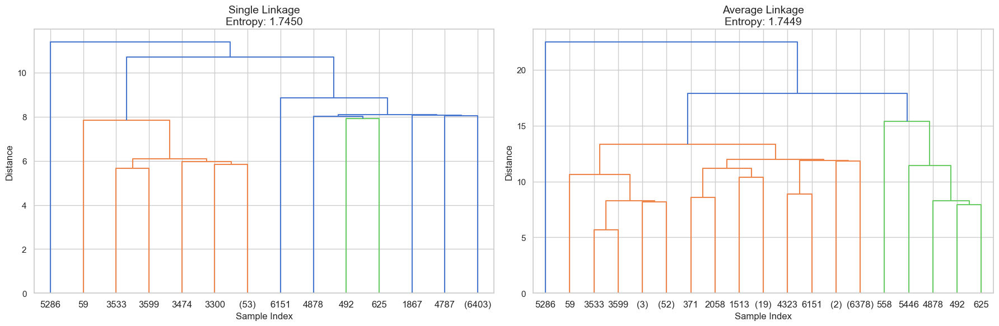

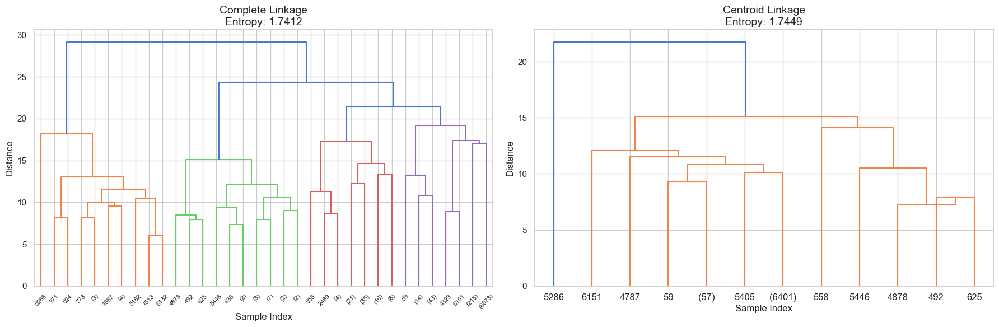

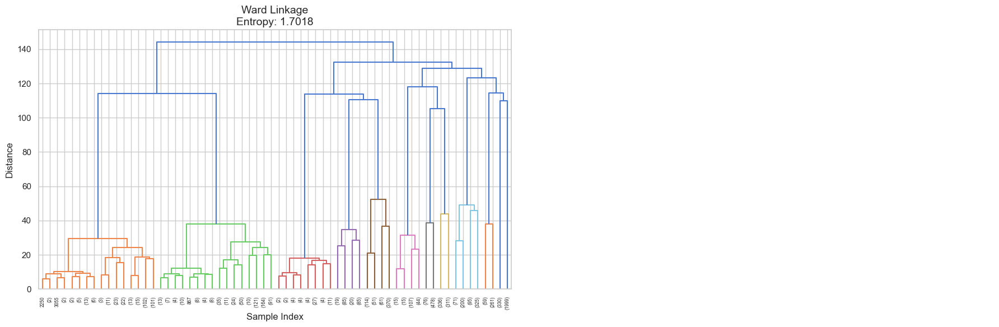

In [70]:
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from scipy.stats import entropy
from collections import Counter

def cluster_entropy(y_external, y_pred):
    clusters = np.unique(y_pred)
    total_entropy = 0
    total_points = len(y_pred)

    for cluster in clusters:
        cluster_indices = np.where(y_pred == cluster)[0]
        cluster_labels = y_external[cluster_indices]

        label_counts = Counter(cluster_labels)
        probs = np.array(list(label_counts.values())) / len(cluster_labels)
        cluster_ent = entropy(probs, base=2)

        total_entropy += (len(cluster_labels) / total_points) * cluster_ent

    return total_entropy

linkage_methods = ['single', 'average', 'complete', 'centroid', 'ward']
num_clusters = 5  

for i in range(0, len(linkage_methods), 2):
    fig, axes = plt.subplots(1, 2, figsize=(18, 6))

    for j in range(2):
        if i + j < len(linkage_methods):
            method = linkage_methods[i + j]
            Z = linkage(X_pca, method=method, metric='euclidean')

            clusters = fcluster(Z, num_clusters, criterion='maxclust')
            h_class_given_cluster = cluster_entropy(y_clean.values, clusters)

            ax = axes[j]
            dendrogram(Z, truncate_mode='level', p=5, ax=ax)
            ax.set_title(f"{method.capitalize()} Linkage\nEntropy: {h_class_given_cluster:.4f}", fontsize=14)
            ax.set_xlabel("Sample Index")
            ax.set_ylabel("Distance")
        else:
            axes[j].axis('off')

    plt.tight_layout()
    plt.show()

After performing hierarchical clustering (and the entropy for each type of linkage, we analysed the performances further with purity and silhouette scores (as well as silhouette plots). 
As can be seen from the plots and the purity score, ward linkage is the type of linkage that works best in this case. 

The silhouette plots indicate that the clusters are very sparse and not homogeneous, indicating that the intra-cluster distance might not be much smaller than the inter-cluster distance.


=== Single Linkage ===
Silhouette Score: 0.388
Purity Score:     0.436

=== Average Linkage ===
Silhouette Score: 0.403
Purity Score:     0.436


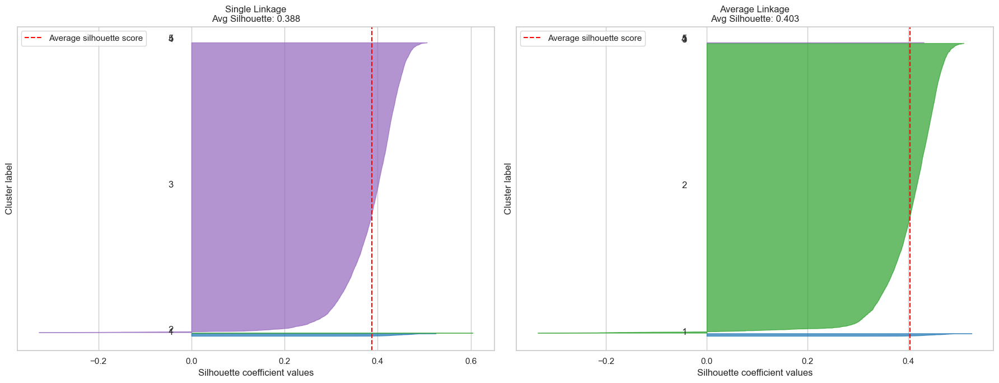


=== Complete Linkage ===
Silhouette Score: 0.274
Purity Score:     0.443

=== Centroid Linkage ===
Silhouette Score: 0.395
Purity Score:     0.436


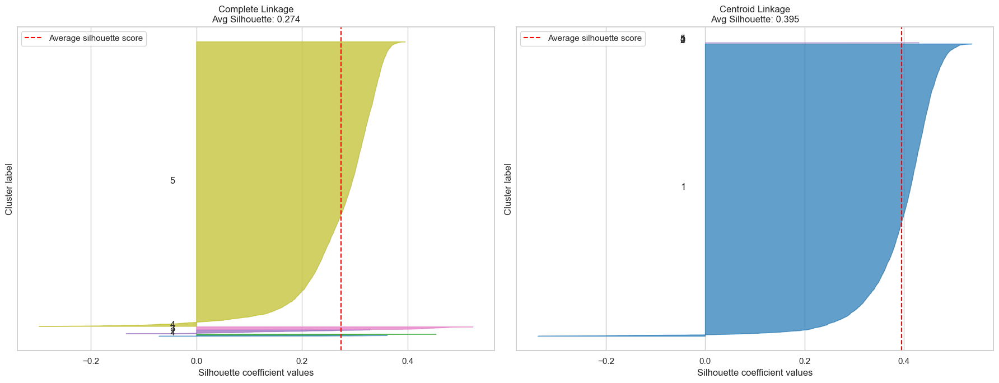


=== Ward Linkage ===
Silhouette Score: 0.065
Purity Score:     0.490


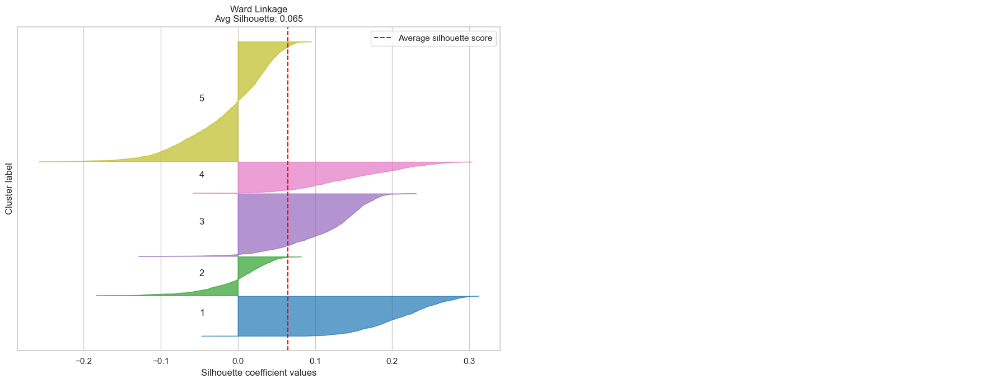

In [71]:
from scipy.cluster.hierarchy import linkage, fcluster
from sklearn.metrics import silhouette_score, silhouette_samples
from scipy.optimize import linear_sum_assignment

linkage_methods = ['single', 'average', 'complete', 'centroid', 'ward']
num_clusters = 5
X_for_clustering = X_pca  
external_labels = y_clean

def purity_score(y_external, y_pred):
    contingency = pd.crosstab(y_pred, y_external)
    return np.sum(np.amax(contingency.values, axis=1)) / np.sum(contingency.values)

for i in range(0, len(linkage_methods), 2):
    fig, axes = plt.subplots(1, 2, figsize=(18, 7))
    
    for j in range(2):
        idx = i + j
        if idx >= len(linkage_methods):
            axes[j].axis('off')
            continue
        
        linkage_method = linkage_methods[idx]
        print(f"\n=== {linkage_method.capitalize()} Linkage ===")

        Z = linkage(X_for_clustering, method=linkage_method, metric='euclidean')
        clusters = fcluster(Z, num_clusters, criterion='maxclust')

        sil_score = silhouette_score(X_for_clustering, clusters)
        purity = purity_score(external_labels, clusters)
        sample_silhouette_values = silhouette_samples(X_for_clustering, clusters)

        print(f"Silhouette Score: {sil_score:.3f}")
        print(f"Purity Score:     {purity:.3f}")

        ax = axes[j]
        y_lower = 10
        for k in range(1, num_clusters + 1):
            ith_cluster_silhouette_values = sample_silhouette_values[clusters == k]
            ith_cluster_silhouette_values.sort()
            size_cluster_k = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_k
            color = plt.cm.tab10((k - 1) / num_clusters)
            ax.fill_betweenx(np.arange(y_lower, y_upper),
                             0, ith_cluster_silhouette_values,
                             facecolor=color, edgecolor=color, alpha=0.7)
            ax.text(-0.05, y_lower + 0.5 * size_cluster_k, str(k))
            y_lower = y_upper + 10

        ax.set_title(f"{linkage_method.capitalize()} Linkage\nAvg Silhouette: {sil_score:.3f}")
        ax.set_xlabel("Silhouette coefficient values")
        ax.set_ylabel("Cluster label")
        ax.axvline(x=sil_score, color="red", linestyle="--", label="Average silhouette score")
        ax.set_yticks([])
        ax.legend()
    
    plt.tight_layout()
    plt.show()



Consequently, we moved on to K means. For each random state (displayed for reproducibility), we computed the silhouette score, the purity score for each cluster, and also the overall purity. The average purity for each random state does not exceed 0.64, indicating that the clusters are not made up of elements from the same class (thus indicating a not so correct classification of the unlabeled data).

In [72]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

def cluster_purities(y_external, y_pred):
    contingency = pd.crosstab(y_pred, y_external)
    cluster_purity_scores = {}
    for cluster_id in contingency.index:
        cluster_counts = contingency.loc[cluster_id]
        majority_class_count = cluster_counts.max()
        total_cluster_count = cluster_counts.sum()
        purity = majority_class_count / total_cluster_count
        cluster_purity_scores[cluster_id] = purity

    for cluster, purity in cluster_purity_scores.items():
        print(f"  Cluster {cluster}: Purity = {purity:.3f}")
    print("  Overall Clustering Purity:", np.mean(list(cluster_purity_scores.values())))
    print()

num_clusters = 5
random_states = [0, 42, 100, 123, 999]

for rs in random_states:
    print(f"KMeans with random_state={rs}:")
    kmeans = KMeans(n_clusters=num_clusters, random_state=rs, n_init=10)
    clusters = kmeans.fit_predict(X_pca)

    sil_score = silhouette_score(X_pca, clusters)
    print(f"  Silhouette Score: {sil_score:.4f}")

    cluster_purities(y_clean.values, clusters)


KMeans with random_state=0:
  Silhouette Score: 0.0848
  Cluster 0: Purity = 0.607
  Cluster 1: Purity = 0.491
  Cluster 2: Purity = 0.483
  Cluster 3: Purity = 0.728
  Cluster 4: Purity = 0.529
  Overall Clustering Purity: 0.5676253363768624

KMeans with random_state=42:
  Silhouette Score: 0.0871
  Cluster 0: Purity = 0.500
  Cluster 1: Purity = 0.520
  Cluster 2: Purity = 0.580
  Cluster 3: Purity = 0.629
  Cluster 4: Purity = 0.568
  Overall Clustering Purity: 0.5592663948004959

KMeans with random_state=100:
  Silhouette Score: 0.0951
  Cluster 0: Purity = 0.621
  Cluster 1: Purity = 0.482
  Cluster 2: Purity = 0.457
  Cluster 3: Purity = 0.632
  Cluster 4: Purity = 0.700
  Overall Clustering Purity: 0.5784650660855604

KMeans with random_state=123:
  Silhouette Score: 0.0817
  Cluster 0: Purity = 0.520
  Cluster 1: Purity = 0.535
  Cluster 2: Purity = 0.603
  Cluster 3: Purity = 0.642
  Cluster 4: Purity = 0.760
  Overall Clustering Purity: 0.611902461077839

KMeans with random_s

We then computed the entropy for each random state – it is aligned to the other evaluation metrics.

In [73]:
from scipy.stats import entropy
from collections import Counter

def cluster_entropy(y_external, y_pred):
    clusters = np.unique(y_pred)
    total_entropy = 0
    total_points = len(y_pred)
    
    for cluster in clusters:
        cluster_indices = np.where(y_pred == cluster)[0]
        cluster_labels = y_external[cluster_indices]
        
        label_counts = Counter(cluster_labels)
        probs = np.array(list(label_counts.values())) / len(cluster_labels)
        cluster_ent = entropy(probs, base=2)  # Use base 2 for bits, or np.e for nats
        
        total_entropy += (len(cluster_labels) / total_points) * cluster_ent
        
    return total_entropy

num_clusters = 5
random_states = [0, 42, 100, 123, 999]

for rs in random_states:
    print(f"\nKMeans with random_state={rs}:")
    kmeans = KMeans(n_clusters=num_clusters, n_init=10, random_state=rs)
    clusters = kmeans.fit_predict(X_pca)

    sil_score = silhouette_score(X_pca, clusters)
    h_class_given_cluster = cluster_entropy(y_clean.values, clusters)

    print(f"  Silhouette Score: {sil_score:.4f}")
    print(f"  Entropy H(class | cluster): {h_class_given_cluster:.4f}")



KMeans with random_state=0:
  Silhouette Score: 0.0848
  Entropy H(class | cluster): 1.5642

KMeans with random_state=42:
  Silhouette Score: 0.0871
  Entropy H(class | cluster): 1.6243

KMeans with random_state=100:
  Silhouette Score: 0.0951
  Entropy H(class | cluster): 1.5316

KMeans with random_state=123:
  Silhouette Score: 0.0817
  Entropy H(class | cluster): 1.4905

KMeans with random_state=999:
  Silhouette Score: 0.0819
  Entropy H(class | cluster): 1.4910


The k means results were then plotted with t-SNE. 

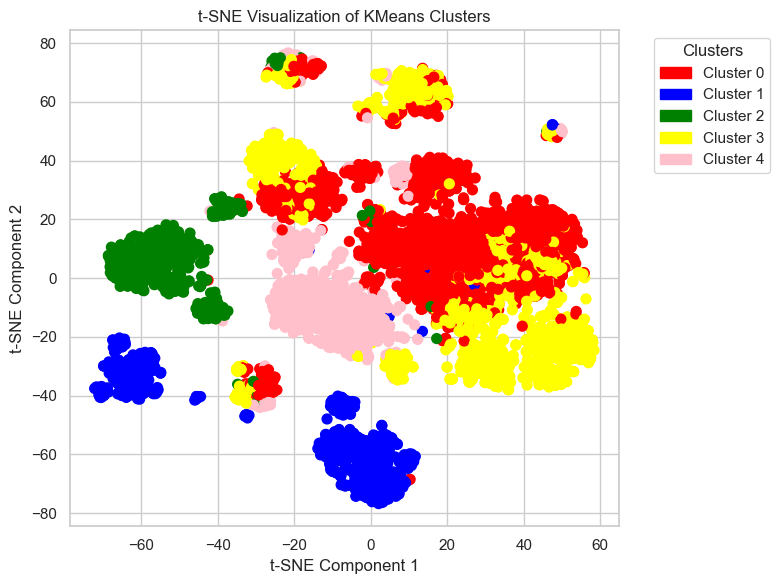

In [74]:
from sklearn.manifold import TSNE
from matplotlib.patches import Patch

kmeans = KMeans(n_clusters=num_clusters, n_init=10, random_state=42)
cluster_labels = kmeans.fit_predict(X_pca)

tsne_2d = TSNE(n_components=2, random_state=42)
X_embedded_2 = tsne_2d.fit_transform(X_pca)

custom_colors = ["red", "blue", "green", "yellow", "pink"]
num_clusters = len(np.unique(cluster_labels))

colors = [custom_colors[label] for label in cluster_labels]

plt.figure(figsize=(8, 6))
scatter = plt.scatter(X_embedded_2[:, 0], X_embedded_2[:, 1], 
                      c=colors, s=50)

handles = [Patch(color=custom_colors[i], label=f'Cluster {i}') for i in range(num_clusters)]

plt.legend(handles=handles, title="Clusters", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title("t-SNE Visualization of KMeans Clusters")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.tight_layout()
plt.show()

Since both hierarchical clustering and K means did not perform too well, we then continued the analysis with DBSCAN. 
The silhouette score, entropy and purity all indicate that the clustering is not being performed well. 

In [75]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import confusion_matrix
from scipy.optimize import linear_sum_assignment

db = DBSCAN(eps=4, min_samples=3).fit(X_pca)
dbscan_labels = db.labels_

mask = dbscan_labels != -1

if np.any(mask):
    sil_score = silhouette_score(X_pca[mask], dbscan_labels[mask])
    print(f"Silhouette Score (DBSCAN): {sil_score:.4f}")
else:
    print("All points classified as noise.")

def purity_score(y_external, y_pred):
    y_external = np.array(y_external).astype(str)
    y_pred = np.array(y_pred).astype(str)
    mask = y_pred != '-1'
    contingency = confusion_matrix(y_external[mask], y_pred[mask])
    row_ind, col_ind = linear_sum_assignment(-contingency)
    return contingency[row_ind, col_ind].sum() / np.sum(contingency)

def cluster_entropy(y_external, y_pred):
    y_external = np.array(y_external)
    y_pred = np.array(y_pred)
    mask = y_pred != -1  # to exclude noise
    y_external = y_external[mask]
    y_pred = y_pred[mask]

    clusters = np.unique(y_pred)
    total_entropy = 0
    total_points = len(y_pred)

    for cluster in clusters:
        cluster_indices = np.where(y_pred == cluster)[0]
        cluster_labels = y_external[cluster_indices]

        label_counts = Counter(cluster_labels)
        probs = np.array(list(label_counts.values())) / len(cluster_labels)
        cluster_ent = entropy(probs, base=2)

        total_entropy += (len(cluster_labels) / total_points) * cluster_ent

    return total_entropy

pur_score = purity_score(y_clean.values, dbscan_labels)
ent_score = cluster_entropy(y_clean.values, dbscan_labels)

print(f"Purity Score (DBSCAN): {pur_score:.4f}")
print(f"Entropy H(class | cluster) (DBSCAN): {ent_score:.4f}")

Silhouette Score (DBSCAN): 0.0376
Purity Score (DBSCAN): 0.4220
Entropy H(class | cluster) (DBSCAN): 1.6883


For DBSCAN, many of the data points have been classified as noise points (visible in black in the plot). Because of this, we lowered the Min_samples, in order to try to reduce the amount of noise.

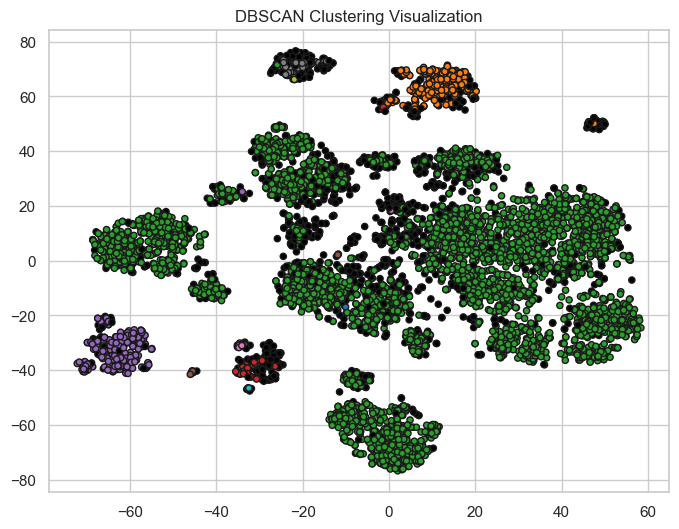

In [76]:
unique_labels = np.unique(dbscan_labels)

num_clusters = len(unique_labels[unique_labels != -1])  
colors_map = plt.cm.tab10  

colors = []
for label in dbscan_labels:
    if label == -1:
        colors.append('black')  # noise color
    else:
        cluster_index = np.where(unique_labels == label)[0][0]
        colors.append(colors_map(cluster_index % 10))  

plt.figure(figsize=(8, 6))
plt.scatter(X_embedded_2[:, 0], X_embedded_2[:, 1], c=colors, s=20, edgecolor='k')
plt.title("DBSCAN Clustering Visualization")
plt.show()


It is also possible to view the performance of DBSCAN as the Eps parameter increases. As mentioned before, we kept the parameter min_samples at 3 to reduce the amount of points grouped as noise points.  

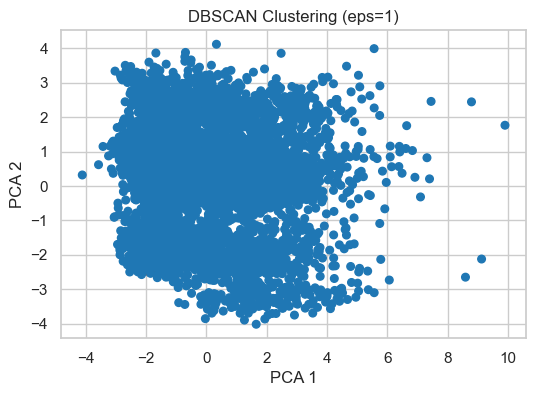

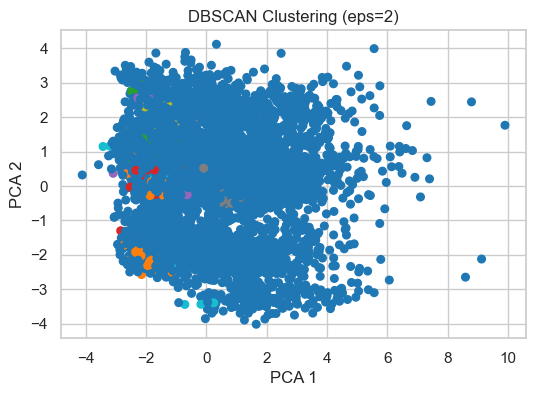

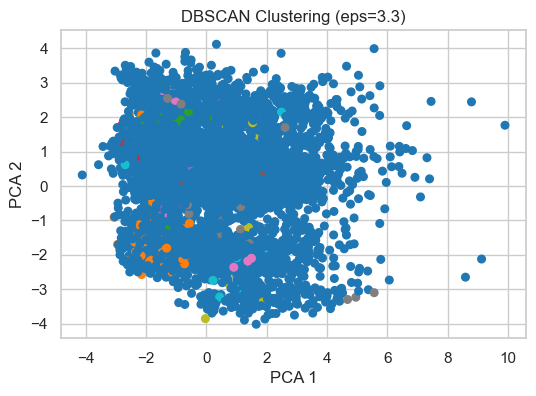

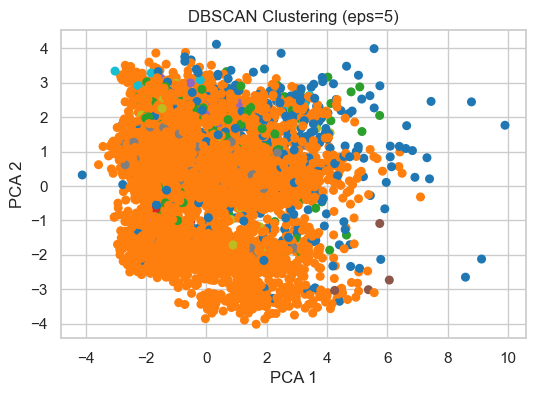

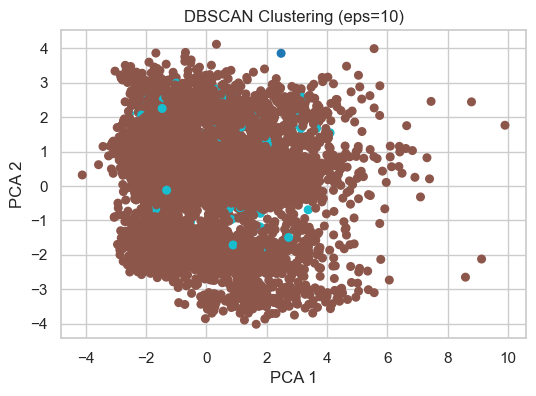

In [77]:
for eps in [1, 2, 3.3, 5, 10]:
    db = DBSCAN(eps=eps, min_samples=3).fit(X_pca)
    labels = db.labels_
    
    plt.figure(figsize=(6,4))
    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='tab10', s=30)
    plt.title(f'DBSCAN Clustering (eps={eps})')
    plt.xlabel('PCA 1')
    plt.ylabel('PCA 2')
    plt.show()

As opposed to the PCA visualization (seen above), we also plotted the DBSCAN results with t-SNE. Even when increasing the parameter Eps, the clustering is still not performing well.

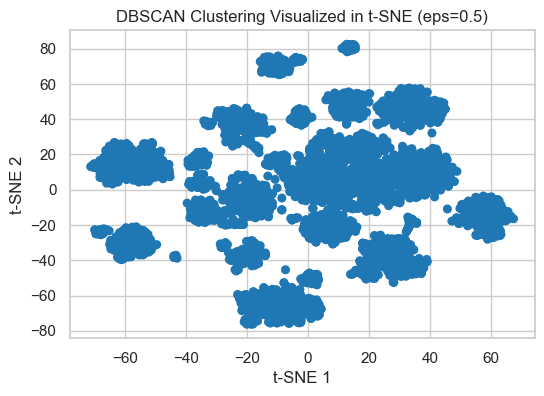

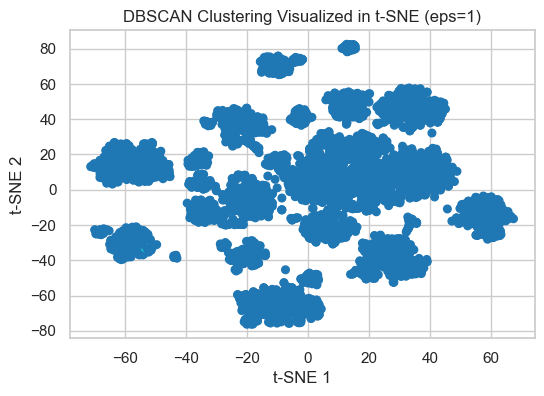

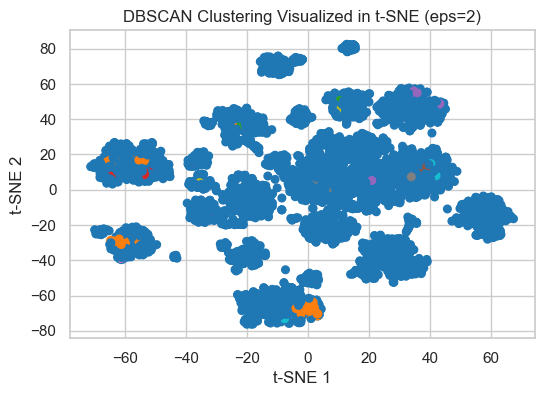

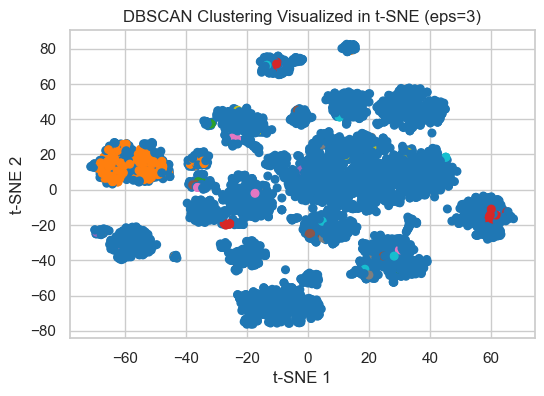

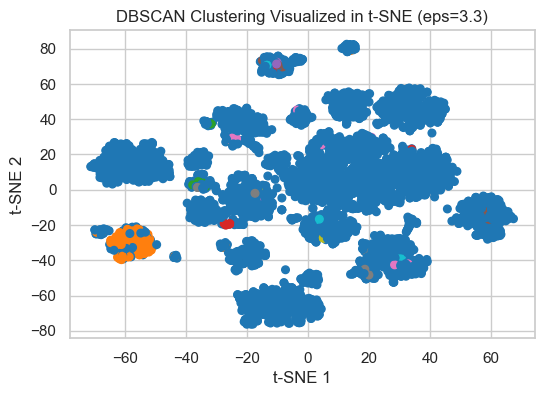

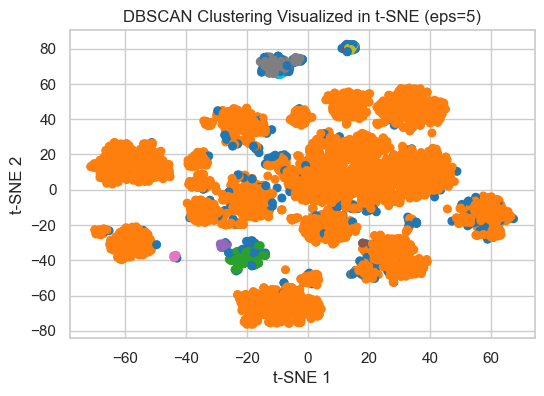

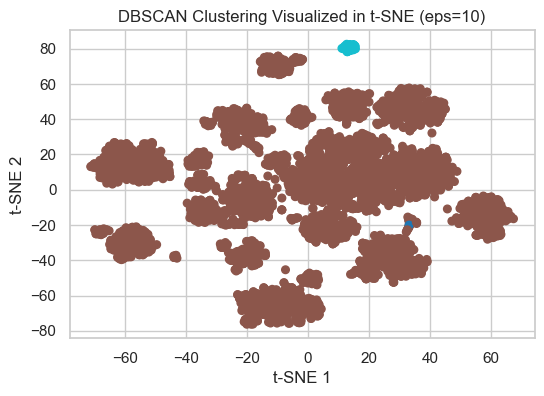

In [78]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=42, perplexity=30)
X_tsne = tsne.fit_transform(X_scaled)

for eps in [0.5, 1, 2, 3, 3.3, 5, 10]:
    db = DBSCAN(eps=eps, min_samples=3).fit(X_pca) 
    labels = db.labels_
    
    plt.figure(figsize=(6, 4))
    plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=labels, cmap='tab10', s=30)
    plt.title(f'DBSCAN Clustering Visualized in t-SNE (eps={eps})')
    plt.xlabel('t-SNE 1')
    plt.ylabel('t-SNE 2')
    plt.show()

Going on with the clustering, we then tried to visualize the data with UMAP. One the left, we can see a lot of small, sparse clusters, and on the right we can see the correspondence with the external labeling (just for visualization). 

/opt/anaconda3/envs/GDV/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


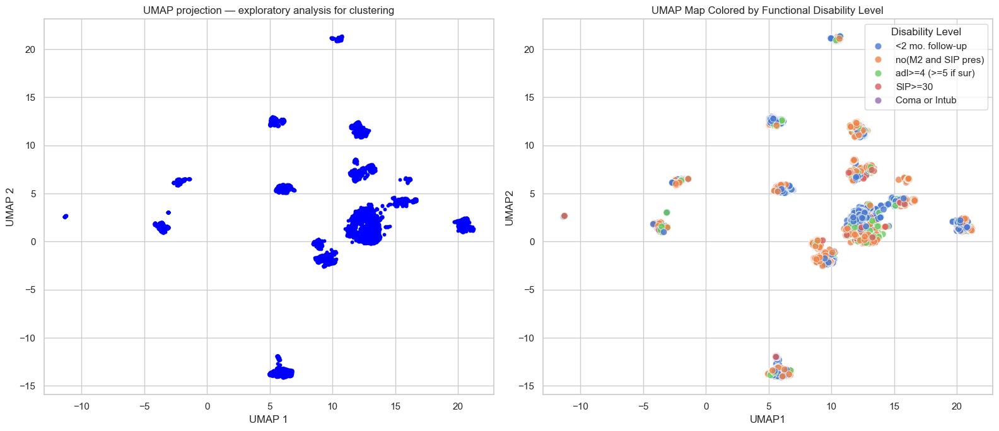

In [79]:
import umap
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_features_clean)

# for 2D visualization
umap_2d = umap.UMAP(n_neighbors=30, min_dist=0.1, n_components=2)
umap_2d_results = umap_2d.fit_transform(X_scaled)

fig, axes = plt.subplots(1, 2, figsize=(16, 7)) 

axes[0].scatter(umap_2d_results[:, 0], umap_2d_results[:, 1], c='blue', s=10)
axes[0].set_title("UMAP projection — exploratory analysis for clustering")
axes[0].set_xlabel("UMAP 1")
axes[0].set_ylabel("UMAP 2")

df_plot = pd.DataFrame(umap_2d_results, columns=['UMAP1', 'UMAP2'])
df_plot['ExternalLabel'] = y_clean.values  

sns.scatterplot(
    x='UMAP1', y='UMAP2',
    hue='ExternalLabel',
    data=df_plot,
    s=60,
    alpha=0.8,
    ax=axes[1]
)
axes[1].set_title('UMAP Map Colored by Functional Disability Level')
axes[1].legend(title='Disability Level')

plt.tight_layout()
plt.show()

For PCA, we can conclude that the principal components with the majority of the explained variance are not useful to separate the data.

After not getting the results that we hoped using hierarchical clustering and kmeans on PCA, we decided to try using Gaussian Mixture Models. The goal in this case, is to use a probabilistic method in order to provide a probability of a poing belonging to a class.
For this GMM, we also check the Akaike Information Criterion, and the Bayesian Information Criterion, which are both visible in the plot below. As can be seen from the plot of the GMM, there does not seem to be a significant structure in the unlabeled data.

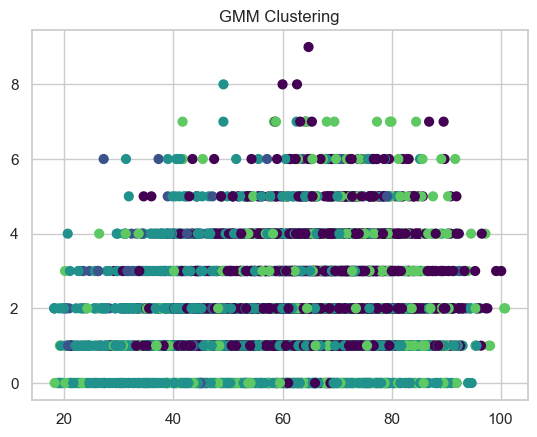

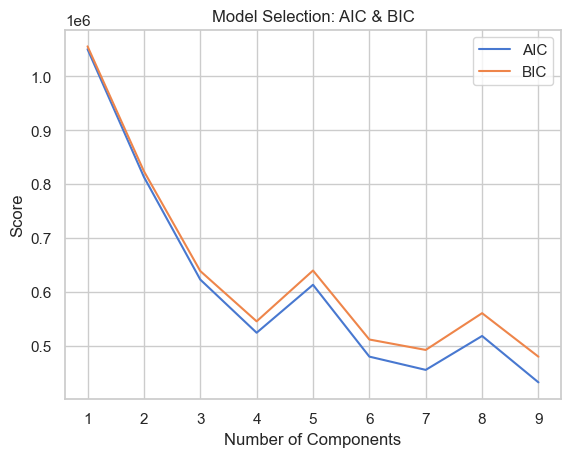

In [80]:
from sklearn.mixture import GaussianMixture

gmm = GaussianMixture(n_components=5, random_state=0)
gmm.fit(X_features_clean)

labels = gmm.predict(X_features_clean)

probs = gmm.predict_proba(X_features_clean)

means = gmm.means_
covariances = gmm.covariances_
plt.scatter(X_features_clean.values[:, 0], X_features_clean.values[:, 1], c=labels, s=40, cmap='viridis')
plt.title("GMM Clustering")
plt.show()

aic = []
bic = []
n_components = range(1, 10)

for n in n_components:
    gmm = GaussianMixture(n_components=n, random_state=0)
    gmm.fit(X_features_clean)
    aic.append(gmm.aic(X_features_clean))
    bic.append(gmm.bic(X_features_clean))

plt.plot(n_components, aic, label='AIC')
plt.plot(n_components, bic, label='BIC')
plt.xlabel('Number of Components')
plt.ylabel('Score')
plt.legend()
plt.title('Model Selection: AIC & BIC')
plt.show()

As can be seen from the plot of the AIC and BIC, both of their scores rise when using 5 components, indicating that, for the data and features that we have, it might be difficult to individuate 5 clusters.

After noticing not quite satisfying clustering results, we decided to also perform clustering in a different way: instead of scaling both numerical and categorical variables together in the same way, we separated them and scaled only the numerical ones (since the categorical ones had already been trasformed with one-hot encoding). 

In [81]:
num_features = ['age', 'num.co', 'scoma','charges','avtisst', 'hday', #income is categorical but ordinal
                'meanbp', 'wblc', 'hrt', 'resp', 'temp', 'pafi', #'totcst'
                'alb', 'bili', 'crea', 'sod', 'bun', 'urine']
cat_features = ['death', 'hospdead', 'sex', 'edu', 'diabetes', 'dementia', 'adlsc', 
                'dzgroup_CHF', 'dzgroup_COPD', 'dzgroup_Cirrhosis',
                'dzgroup_Colon Cancer', 'dzgroup_Coma', 'dzgroup_Lung Cancer',
                'dzgroup_MOSF w/Malig', 'ca_no', 'ca_yes', 'race_black', 'race_hispanic', 'race_other', 'race_white']
                
X_num = X[num_features].copy()
X_cat = X[cat_features].copy()

X_num = X[num_features].astype(float)
X_cat = X[cat_features].astype(float)

mask_all = (X_num.notna().all(axis=1)) & (X_cat.notna().all(axis=1))
X_clean_num = X_num.loc[mask_all].reset_index(drop=True)
X_clean_cat = X_cat.loc[mask_all].reset_index(drop=True)
mask_all_np = mask_all.to_numpy()
y_clean_sep = y['sfdm2'].iloc[mask_all_np].reset_index(drop=True)

print("Final numeric shape:", X_clean_num.shape)
print("Final categorical shape:", X_clean_cat.shape)

scaler = StandardScaler()
X_num_scaled = scaler.fit_transform(X_clean_num)
X_combined = np.hstack([X_num_scaled, X_clean_cat.values]) 
print(X_combined.shape)
print(y_clean_sep.shape)

Final numeric shape: (7248, 18)
Final categorical shape: (7248, 20)
(7248, 38)
(7248,)


/opt/anaconda3/envs/GDV/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


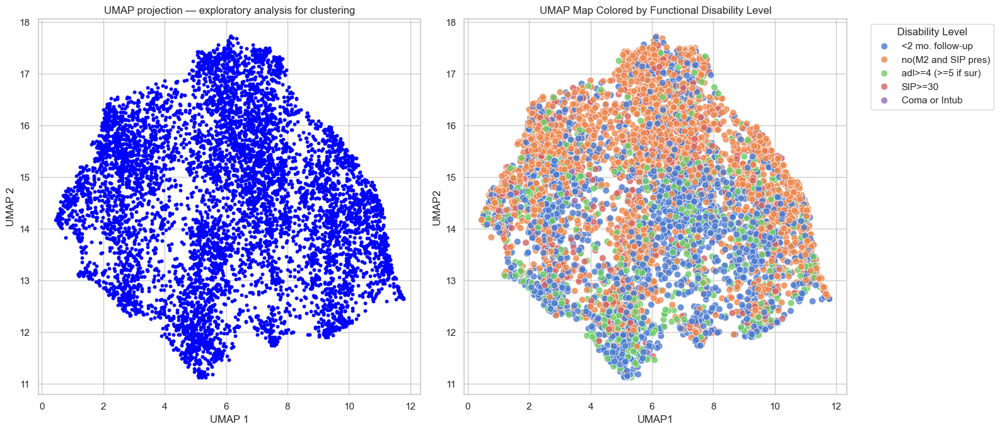

In [82]:
import umap

reducer = umap.UMAP(n_neighbors=15, min_dist=0.1)
umap_results = reducer.fit_transform(X_combined)

fig, axes = plt.subplots(1, 2, figsize=(16, 7)) 

axes[0].scatter(umap_results[:, 0], umap_results[:, 1], c='blue', s=10)
axes[0].set_title("UMAP projection — exploratory analysis for clustering")
axes[0].set_xlabel("UMAP 1")
axes[0].set_ylabel("UMAP 2")

sep_umap_plot = pd.DataFrame(umap_results, columns=['UMAP1', 'UMAP2'])
sep_umap_plot['ExternalLabel'] = y_clean_sep.values

sns.scatterplot(
    x='UMAP1', y='UMAP2',
    hue='ExternalLabel',
    #palette='viridis', 
    data=sep_umap_plot,
    s=60,
    alpha=0.8,
    ax=axes[1]
)
axes[1].set_title('UMAP Map Colored by Functional Disability Level')
axes[1].legend(title='Disability Level', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


Then, we performed PCA (again but with the separate data (numerical/categorical). In this case the number of principal components that explain 90% of the variance is 17.

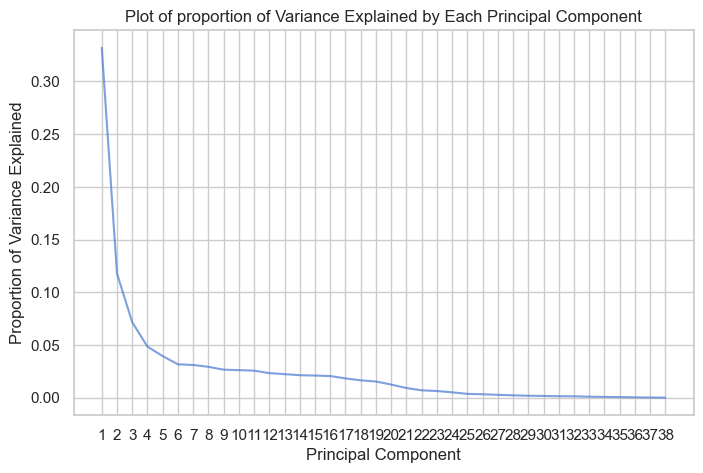

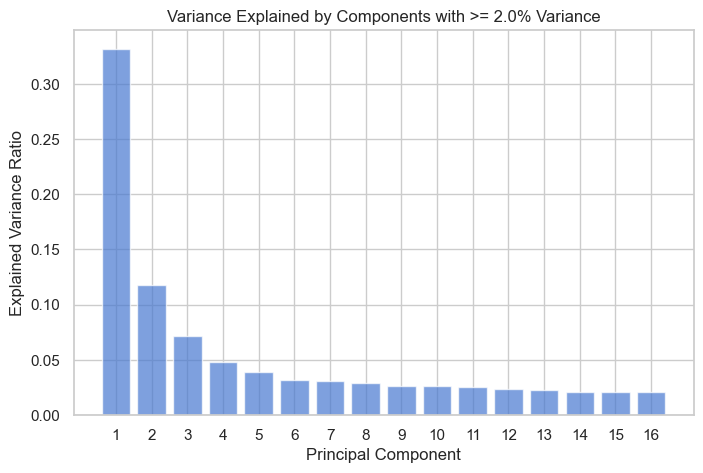

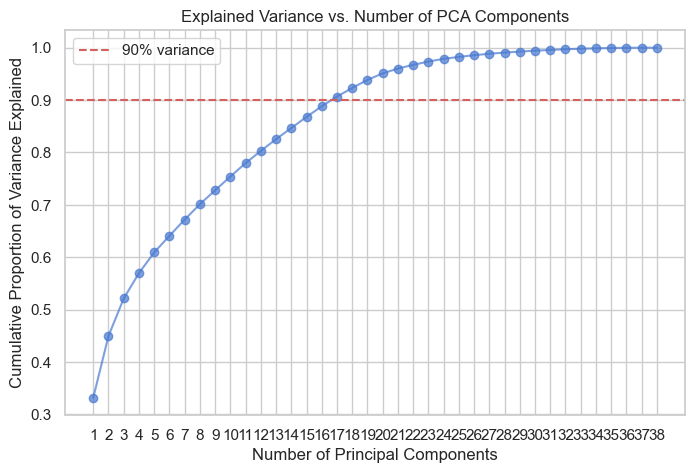

Number of components explaining 90% variance: 17


In [83]:
pca_sep = PCA().fit(X_combined)
X_sep_pca = pca_sep.transform(X_combined)

plt.figure(figsize=(8, 5))
components = range(1, len(pca_sep.explained_variance_ratio_) + 1)
plt.plot(components, pca_sep.explained_variance_ratio_, alpha=0.7)
plt.xlabel('Principal Component')
plt.ylabel('Proportion of Variance Explained')
plt.title('Plot of proportion of Variance Explained by Each Principal Component')
plt.xticks(components)
plt.show()

threshold = 0.02
explained_variance = pca_sep.explained_variance_ratio_
filtered_indices = [i for i, var in enumerate(explained_variance) if var >= threshold]
filtered_components = [i + 1 for i in filtered_indices]
filtered_variance = [explained_variance[i] for i in filtered_indices]
plt.figure(figsize=(8, 5))
plt.bar(filtered_components, filtered_variance, alpha=0.7)
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title(f'Variance Explained by Components with >= {threshold*100}% Variance')
plt.xticks(filtered_components)
plt.show()

cumulative_variance = np.cumsum(pca_sep.explained_variance_ratio_)
components = range(1, len(cumulative_variance) + 1)

plt.figure(figsize=(8, 5))
plt.plot(components, cumulative_variance, marker='o', alpha=0.7)
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Proportion of Variance Explained')
plt.title('Explained Variance vs. Number of PCA Components')
plt.xticks(components)
plt.grid(True)
plt.axhline(y=0.9, color='r', linestyle='--', label='90% variance')
plt.legend()
plt.show()

n_components_90 = np.argmax(cumulative_variance >= 0.90) + 1
print(f"Number of components explaining 90% variance: {n_components_90}")

In [84]:
from scipy.optimize import linear_sum_assignment

def purity_score(y_external, y_pred):
    contingency = confusion_matrix(y_external, y_pred)
    row_ind, col_ind = linear_sum_assignment(-contingency)
    return contingency[row_ind, col_ind].sum() / np.sum(contingency)

y_labels = y_clean_sep.astype(str)

for n in [5, 10, 12, 15, 17]:
    X_reduced = X_sep_pca[:, :n]

    kmeans = KMeans(n_clusters=5, random_state=42, n_init=10)
    cluster_labels = kmeans.fit_predict(X_reduced)

    sil = silhouette_score(X_reduced, cluster_labels)
    pur = purity_score(y_labels, cluster_labels.astype(str))

    print(f"{n} Principal Components → Silhouette Score: {sil:.3f} | Purity Score: {pur:.3f}")

5 Principal Components → Silhouette Score: 0.232 | Purity Score: 0.325
10 Principal Components → Silhouette Score: 0.169 | Purity Score: 0.326
12 Principal Components → Silhouette Score: 0.156 | Purity Score: 0.329
15 Principal Components → Silhouette Score: 0.140 | Purity Score: 0.328
17 Principal Components → Silhouette Score: 0.130 | Purity Score: 0.326


In the following plots, it's possible to check how, depending on the Principal Components being considered, the respresentation of the data changes. Nevertheless, it appears as if there was not specific structure in the unlabeled data in line with the external labels.

/opt/anaconda3/envs/GDV/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/GDV/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/GDV/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/GDV/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/GDV/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and w

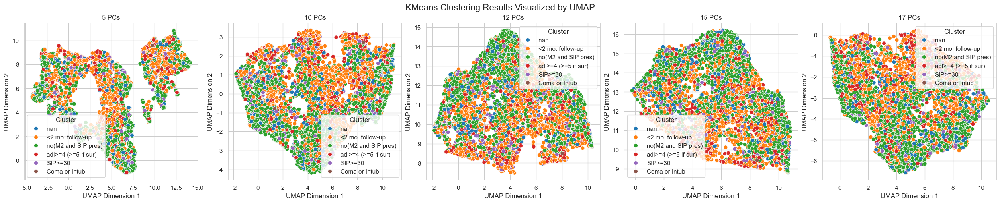

In [85]:
num_clusters = 5
pc_list = [5, 10, 12, 15, 17]

fig, axes = plt.subplots(1, len(pc_list), figsize=(5 * len(pc_list), 5), constrained_layout=True)

for idx, n in enumerate(pc_list):
    X_reduced = X_sep_pca[:, :n]
    
    kmeans = KMeans(n_clusters=num_clusters, random_state=42, n_init=10)
    cluster_labels = kmeans.fit_predict(X_reduced)
    
    reducer = umap.UMAP()
    X_umap = reducer.fit_transform(X_reduced)
    
    df_plot = pd.DataFrame({
        'UMAP1': X_umap[:, 0],
        'UMAP2': X_umap[:, 1],
        'ExternalLabel': y_clean_sep.astype(str)  
    })
    
    ax = axes[idx]
    sns.scatterplot(data=df_plot, x='UMAP1', y='UMAP2', hue='ExternalLabel', palette='tab10', s=50, ax=ax)
    ax.set_title(f"{n} PCs")
    ax.legend(title='Cluster', loc='best')
    ax.set_xlabel('UMAP Dimension 1')
    ax.set_ylabel('UMAP Dimension 2')

plt.suptitle("KMeans Clustering Results Visualized by UMAP", fontsize=16)
plt.show()

Next, it's visible how the data has been represented through t-SNE. Again, it does not appear that there are homogeneous clusters.

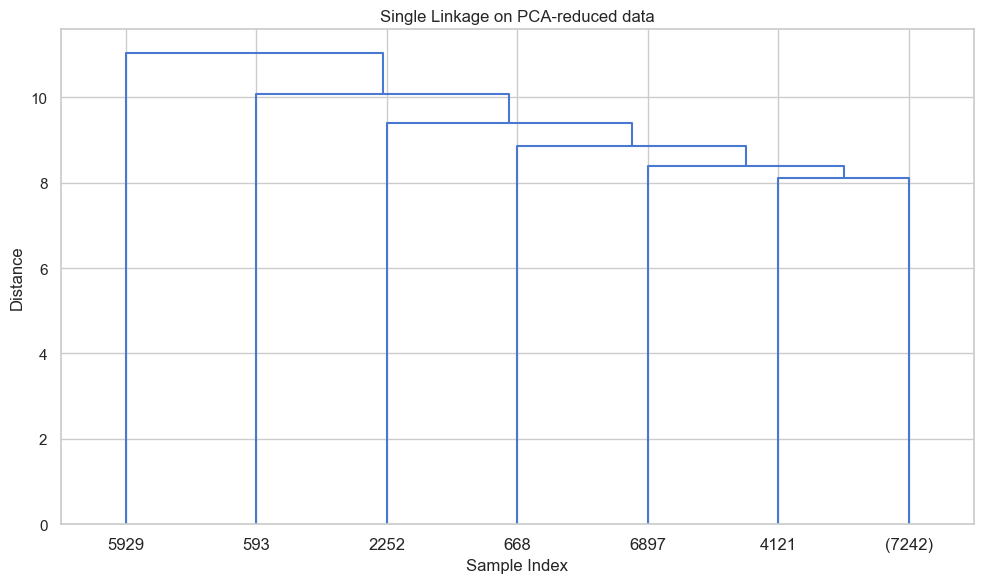

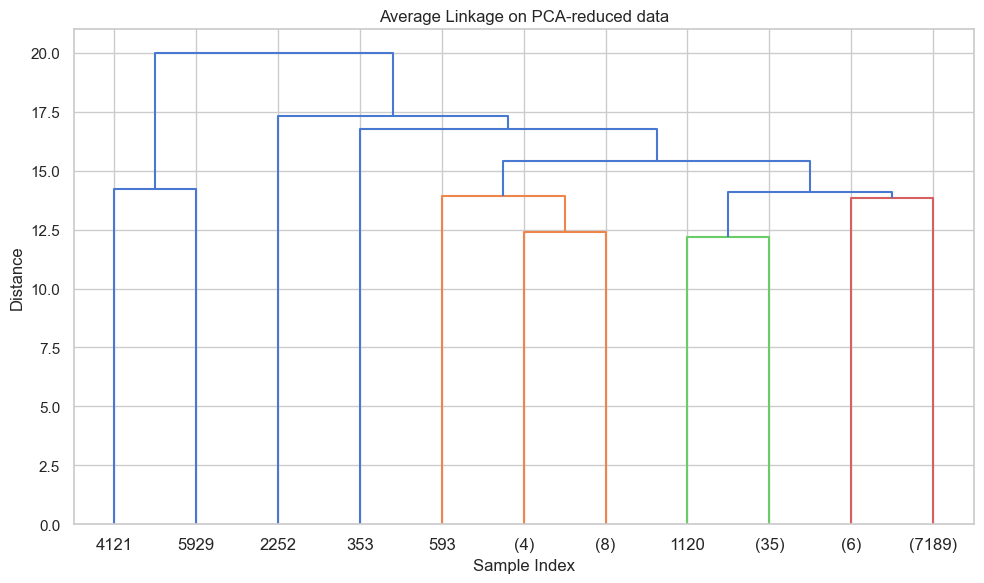

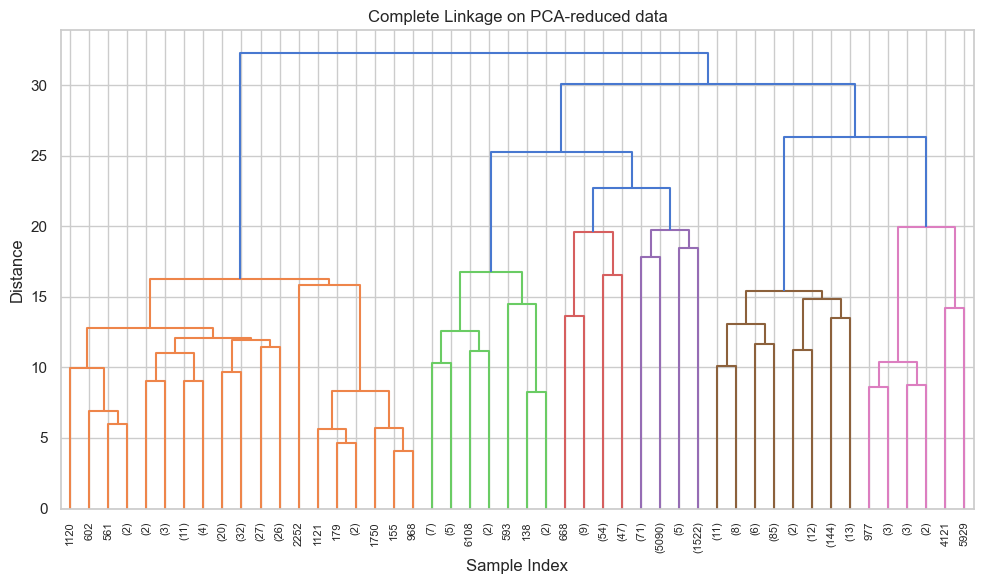

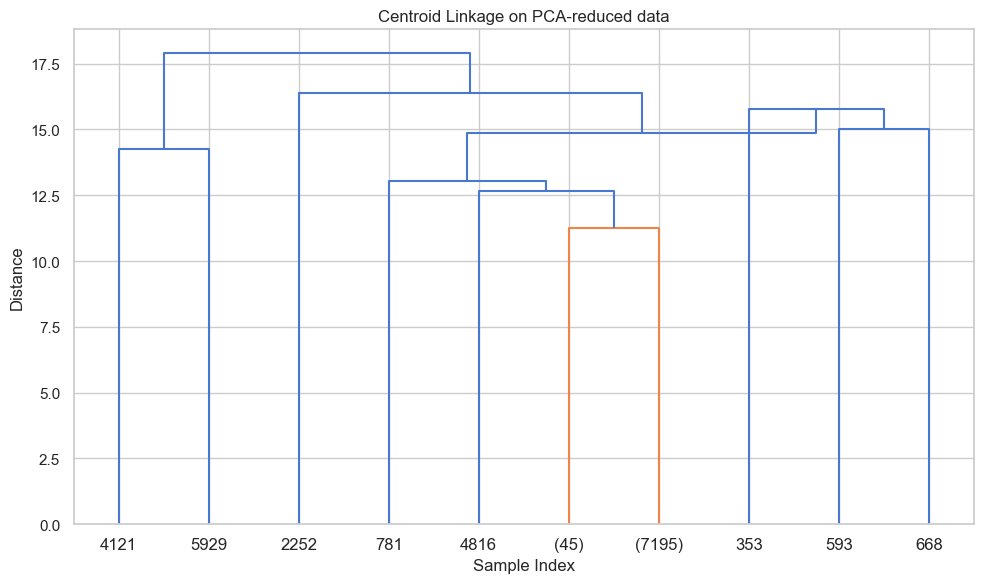

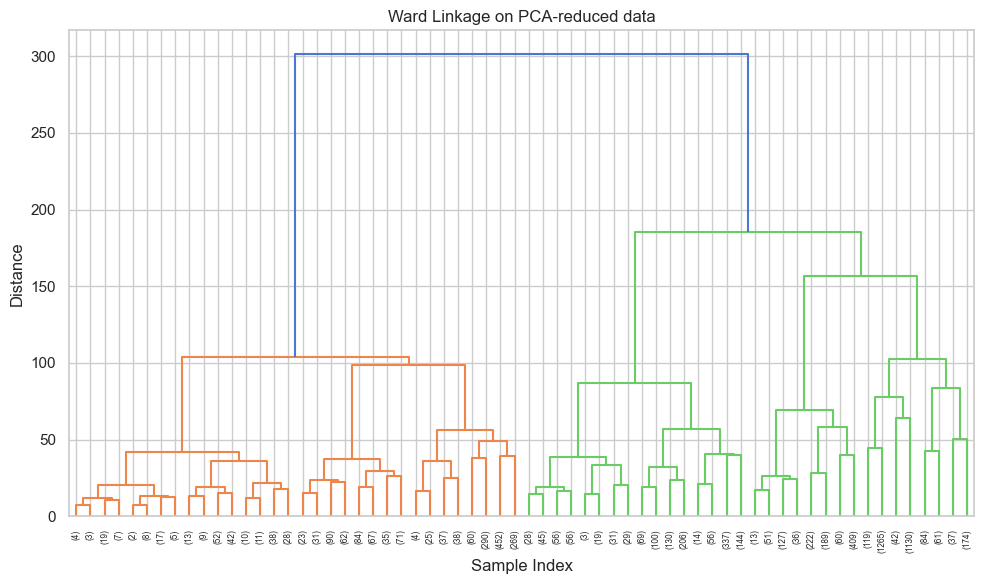

In [86]:
from scipy.cluster.hierarchy import linkage, dendrogram

linkage_methods = ['single', 'average', 'complete', 'centroid', 'ward']

for method in linkage_methods:
    plt.figure(figsize=(10, 6))
    
    Z = linkage(X_sep_pca, method=method, metric='euclidean')
    
    dendrogram(Z, truncate_mode='level', p=5)
    plt.title(f"{method.capitalize()} Linkage on PCA-reduced data")
    plt.xlabel("Sample Index")
    plt.ylabel("Distance")
    plt.tight_layout()
    plt.show()

Hierarchical clustering using scaled numerical variables and unscaled categorical variables.
It appears as though, in this case, complete linkage is performing better.

Since PCA is preferred with mainly numerical data, we then tried to reduce the dimentionality with t-SNE that is a non linear trasoformation. 

/opt/anaconda3/envs/GDV/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


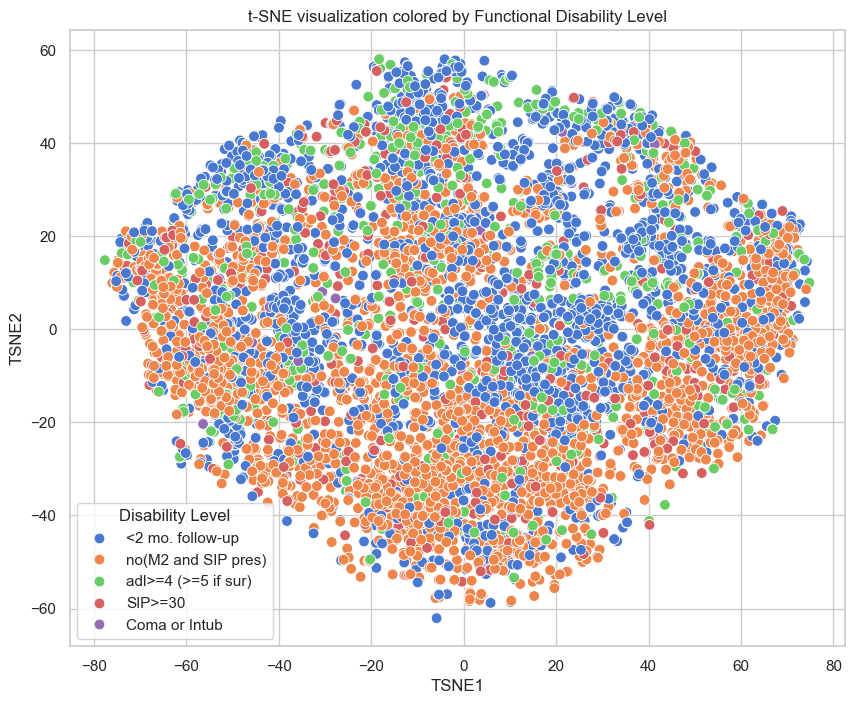

In [87]:
from sklearn.manifold import TSNE

tsne_sep = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
tsne_sep_results = tsne_sep.fit_transform(X_combined)

df_tsne_sep = pd.DataFrame(tsne_sep_results, columns=['TSNE1', 'TSNE2'])
df_tsne_sep['ExternalLabel'] = y_clean_sep.values  


plt.figure(figsize=(10, 8))
sns.scatterplot(x='TSNE1', y='TSNE2', hue='ExternalLabel', data=df_tsne_sep, s=60)
plt.title('t-SNE visualization colored by Functional Disability Level')
plt.legend(title='Disability Level')
plt.show()

With the dimensionality reduction/visualization using t-SNE, the external labels do not seem to have a strong structure. Because of this, we decided to not proceed using the TSNE results.

We also tried to employ the GMM on the separate data (scaled numerical/categorical). As can be seen in the plot, the data cannot be separated into definite clusters.

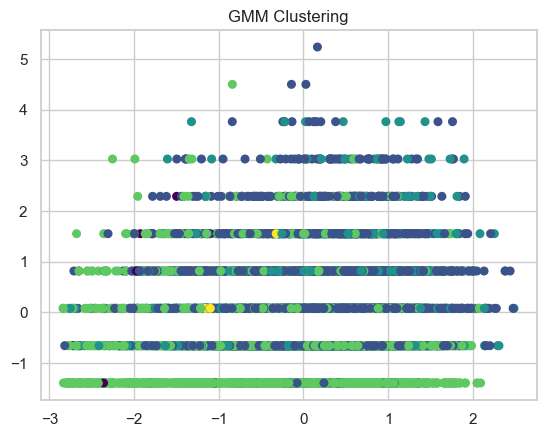

In [88]:
from sklearn.mixture import GaussianMixture

gmm = GaussianMixture(n_components=5, random_state=0)
gmm.fit(X_combined)

labels = gmm.predict(X_combined)

probs = gmm.predict_proba(X_combined)

means = gmm.means_
covariances = gmm.covariances_

plt.scatter(X_combined[:, 0], X_combined[:, 1], c=labels, s=30, cmap='viridis')
plt.title("GMM Clustering")
plt.show()

#### Similarity Matrices
At last, we wanted to check the similarity between pairs of points (on the PCA-reduced data). We computed a similarity matrix of the PCA-reduced data and of the results of K means, with the goal of visualizing possible clusters. 
As can be seen in both of the similarity matrices, there are no visible clusters, thus confirming that the methods employed are deeply affected by the high dimensionality of the data. It was not possible to identify clusters based on the severity levels presented by the 'sfdm2' variable.

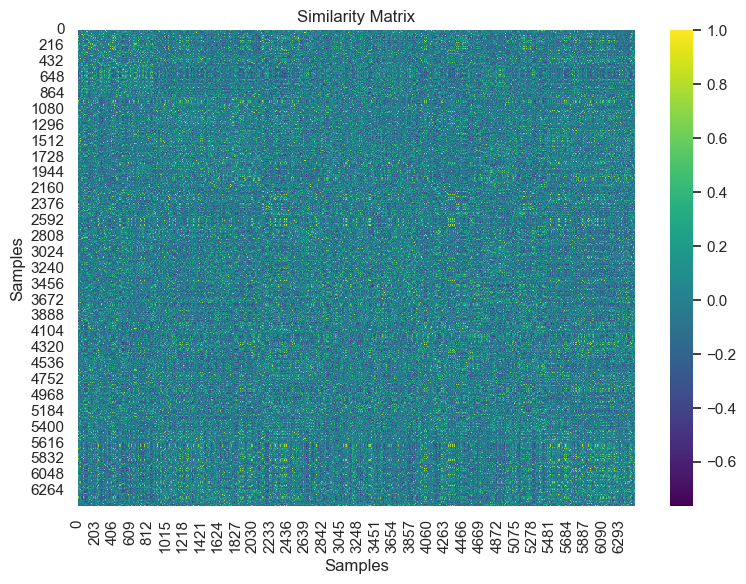

In [89]:
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import pairwise_distances

similarity_matrix_cosine = cosine_similarity(X_pca)

plt.figure(figsize=(8, 6))
sns.heatmap(similarity_matrix_cosine, cmap='viridis')
plt.title("Similarity Matrix")
plt.xlabel("Samples")
plt.ylabel("Samples")
plt.tight_layout()
plt.show()

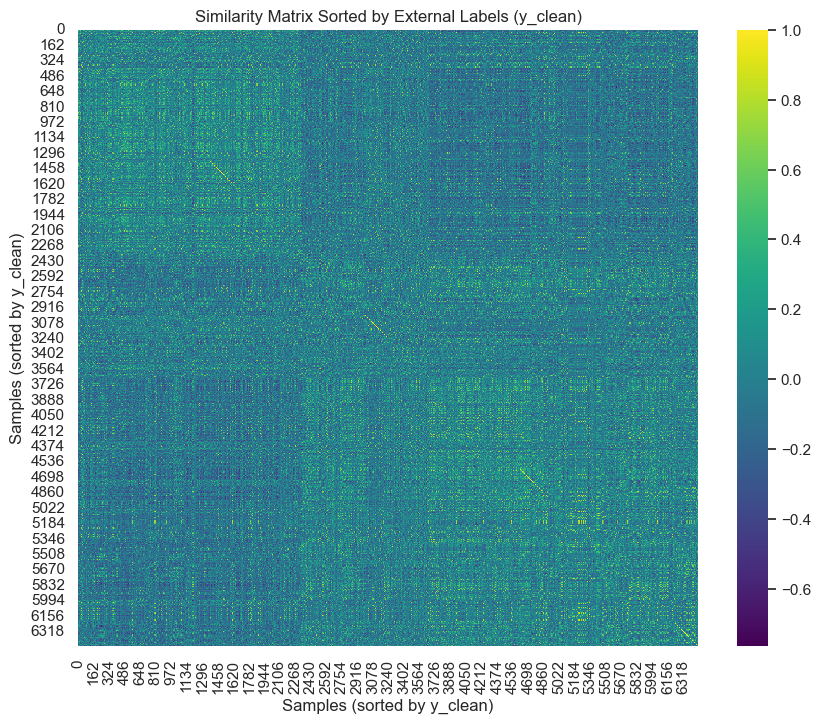

In [90]:
similarity_matrix_sim = cosine_similarity(X_pca)
y_clean_array = np.array(y_clean)
sorted_indices = np.argsort(y_clean_array)

sorted_sim_matrix = similarity_matrix_sim[sorted_indices, :][:, sorted_indices]

plt.figure(figsize=(10, 8))
sns.heatmap(sorted_sim_matrix, cmap='viridis')
plt.title("Similarity Matrix Sorted by External Labels (y_clean)")
plt.xlabel("Samples (sorted by y_clean)")
plt.ylabel("Samples (sorted by y_clean)")
plt.show()

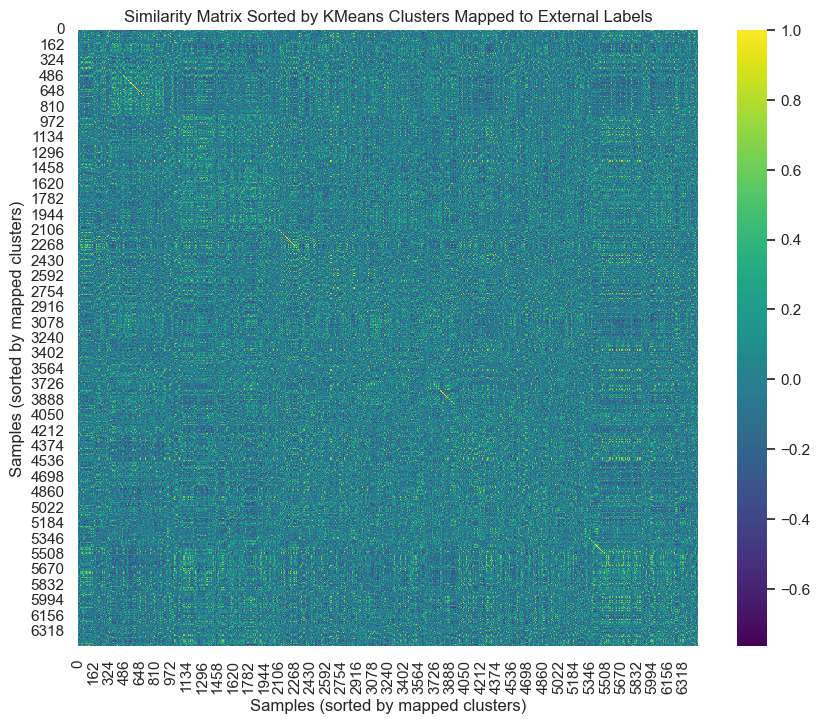

In [91]:
from scipy.optimize import linear_sum_assignment

kmeans = KMeans(n_clusters=5, random_state=42, n_init=10)
kmeans_labels = kmeans.fit_predict(X_pca)

y_clean_str = np.array(y_clean).astype(str)
kmeans_labels_str = kmeans_labels.astype(str)

conf_mat = confusion_matrix(y_clean_str, kmeans_labels_str)

row_ind, col_ind = linear_sum_assignment(-conf_mat)

cluster_to_external_label_str = dict(zip(col_ind, row_ind))

def safe_map(label_str, mapping, default=-1):
    return int(mapping.get(label_str, default))

mapped_labels = np.array([safe_map(lbl, cluster_to_external_label_str) for lbl in kmeans_labels_str])

similarity_matrix = cosine_similarity(X_pca)

sorted_indices = np.argsort(mapped_labels)
sorted_sim_matrix = similarity_matrix[sorted_indices, :][:, sorted_indices]

plt.figure(figsize=(10, 8))
sns.heatmap(sorted_sim_matrix, cmap='viridis')
plt.title("Similarity Matrix Sorted by KMeans Clusters Mapped to External Labels")
plt.xlabel("Samples (sorted by mapped clusters)")
plt.ylabel("Samples (sorted by mapped clusters)")
plt.show()

Furthermore, we repeated the same process for the data containing scaled numerical variables and unscaled categorical variables. 

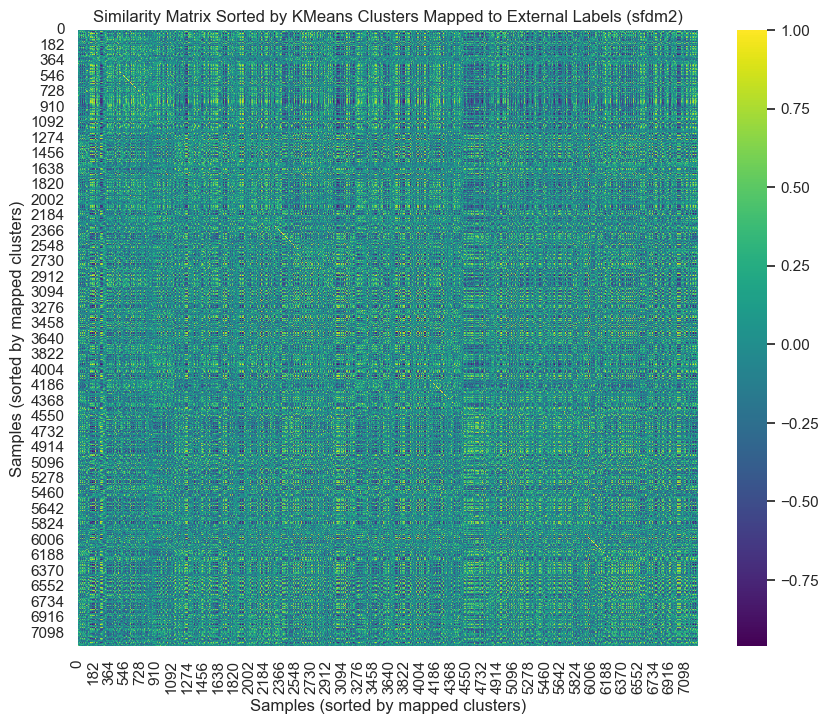

In [92]:
kmeans_sep = KMeans(n_clusters=5, random_state=42, n_init=10)
kmeans_labels_sep = kmeans_sep.fit_predict(X_sep_pca)

y_clean_sep_str = np.array(y_clean_sep).astype(str)
kmeans_labels_str_sep = kmeans_labels_sep.astype(str)

conf_mat_sep = confusion_matrix(y_clean_sep_str, kmeans_labels_str_sep)

row_ind, col_ind = linear_sum_assignment(-conf_mat_sep)

cluster_to_external_label_str = dict(zip(col_ind, row_ind))

def safe_map(label_str, mapping, default=-1):
    return int(mapping.get(label_str, default))

mapped_labels_sep = np.array([safe_map(lbl, cluster_to_external_label_str) for lbl in kmeans_labels_str_sep])

similarity_matrix = cosine_similarity(X_sep_pca)

sorted_indices_sep = np.argsort(mapped_labels_sep)
sorted_sim_matrix_sep = similarity_matrix[sorted_indices_sep, :][:, sorted_indices_sep]

plt.figure(figsize=(10, 8))
sns.heatmap(sorted_sim_matrix_sep, cmap='viridis')
plt.title("Similarity Matrix Sorted by KMeans Clusters Mapped to External Labels (sfdm2)")
plt.xlabel("Samples (sorted by mapped clusters)")
plt.ylabel("Samples (sorted by mapped clusters)")
plt.show()